In [1]:
from multiprocessing import Pool
import os
os.environ['OMP_NUM_THREADS'] = "1"

import numpy as np

import astropy.units as u  
import astropy.constants as c
from astropy.coordinates import SkyCoord

import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import matplotlib 

from astropy.io import fits
from astropy.table import Table, join
from scipy.interpolate import interp1d

from dustmaps.bayestar import BayestarQuery
from dustmaps.vergely2022 import Vergely2022Query
from dustmaps.edenhofer2023 import Edenhofer2023Query

import pickle 
import sys
import os
import tqdm

from scipy.stats import kurtosis, skew

import emcee
import corner

import sys
sys.path.append('/uufs/astro.utah.edu/common/home/u1371365/nanoKT_v1/')
from filehandling import *
from specfns import *

In [2]:
wavs = get_wavs()
window = (wavs > lambda0 - 30) & (wavs <= lambda0 + 30)

In [3]:
CA_meta = Table(fits.open('../Data/230420_CAResiduals/CA_meta.fits')[1].data)
CAresdir = '/uufs/astro.utah.edu/common/home/u1371365/Data/230420_CAResiduals/'
CAMADGICSresdir = '/uufs/astro.utah.edu/common/home/u1371365/Data/230829_MADGICSResiduals/'
starhorsepath = '/uufs/chpc.utah.edu/common/home/sdss/dr17/env/APOGEE_STARHORSE/APOGEE_DR17_EDR3_STARHORSE_v2.fits'
starhorse = Table.read(starhorsepath, hdu = 1)
starhorse = starhorse['APOGEE_ID', 'dist16', 'dist50', 'dist84', 'AV16', 'AV50', 'AV84']

CA_meta = join(CA_meta, starhorse, keys = 'APOGEE_ID', join_type = 'left')
if True:
    with open('/uufs/astro.utah.edu/common/home/u1371365/DIB_KT_CACloud/goodbad.pickle', mode = 'rb') as f:
        goodbad = pickle.load(f)
print(len(goodbad))

CA_meta['GOODBAD'] = goodbad


tabfile = '/uufs/chpc.utah.edu/common/home/sdss/dr17/apogee/spectro/aspcap/dr17/synspec_rev1/allStarLite-dr17-synspec_rev1.fits'
allStar = Table(fits.open(tabfile)[1].data)

CA_meta = join(CA_meta, allStar['APOGEE_ID', 'ASPCAP_CHI2', 'VSCATTER', 'MEANFIB', 'NVISITS' ], keys = 'APOGEE_ID', join_type = 'left')

1476


In [4]:
allStar['MEANFIB']

223.00002
23.955153
166.0
24.65309
263.63733
186.95737
263.85187
222.99998
209.96074
71.3066
71.599464


In [5]:
star = CA_meta[0]

fits.open(get_ca_res(star['FILE']))[3].header

XTENSION= 'IMAGE   '           / Image extension                                
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 8575                                                  
NAXIS2  =                    6                                                  
PCOUNT  =                    0 / number of parameters                           
GCOUNT  =                    1 / number of groups                               
LABEL   = 'Base data'                                                           
FRAME   = 'Rest    '                                                            

In [7]:
fits.open(get_medres(star['TEFF'], star['LOGG'], star['M_H']))[1].header

XTENSION= 'IMAGE   '           / Image extension                                
BITPIX  =                  -64 / array data type                                
NAXIS   =                    1 / number of array dimensions                     
NAXIS1  =                 8575                                                  
PCOUNT  =                    0 / number of parameters                           
GCOUNT  =                    1 / number of groups                               
NAME    = 'MEDIAN  '                                                            
NBIN    =                 1175                                                  
TEFF_MIN=                 6200                                                  
TEFF_MAX=                 6350                                                  
LOGG_MIN=                  4.2                                                  
LOGG_MAX=                  4.4                                                  
M_H_MIN =                 -0

In [7]:
residuals = np.zeros((len(CA_meta), 8575, 2))
spectra = np.zeros((len(CA_meta), 8575, 4))

medresiduals = np.zeros((len(CA_meta), 8575, 2))
for i in range(len(CA_meta)):
    star = CA_meta[i]
    res_hdu = fits.open(get_ca_res(star['FILE']))

    res_remake = res_hdu[3].data[0, :] / res_hdu[3].data[2, :]
    # res_remake = resample_interp(res_remake, star['VHELIO_AVG'])
    residuals[i, :, 0] = res_remake
    residuals[i, :, 1] = res_hdu[3].data[1, :]

    spectra[i, :, 0] = res_hdu[3].data[0, :] # spectrum
    spectra[i, :, 1] = res_hdu[3].data[1, :] # uncertainties
    spectra[i, :, 2] = res_hdu[3].data[2, :] # aspcap model
    spectra[i, :, 3] = res_hdu[3].data[3, :] # aspcap model

    

    medres_hdu = fits.open(get_medres(star['TEFF'], star['LOGG'], star['M_H']))
    medresiduals[i, :, 0] = medres_hdu[1].data
    medresiduals[i, :, 1] = medres_hdu[3].data

/tmp/ipykernel_161208/3028574238.py:9: RuntimeWarning: invalid value encountered in true_divide
  res_remake = res_hdu[3].data[0, :] / res_hdu[3].data[2, :]


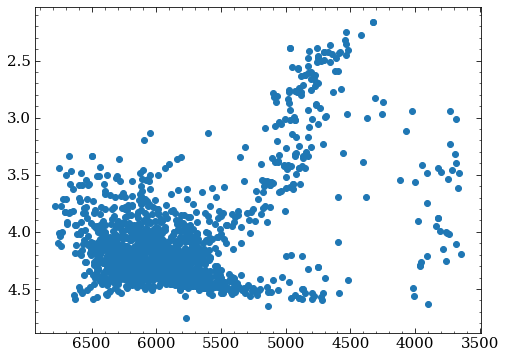

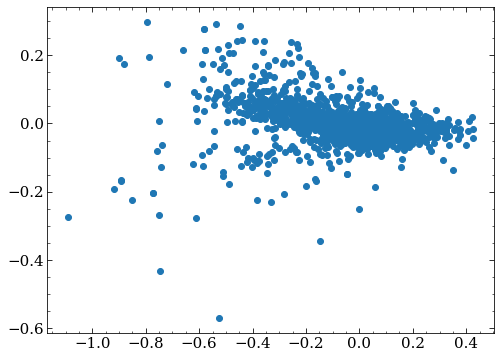

In [8]:
fig, ax = plt.subplots(figsize = (8,6))
ax.scatter(CA_meta['TEFF'], CA_meta['LOGG'])
ymin, ymax = ax.get_ylim()
ax.set_ylim(ymax, ymin)
xmin, xmax = ax.get_xlim()
ax.set_xlim(xmax, xmin)
plt.show()
fig, ax = plt.subplots(figsize = (8,6))
ax.scatter(CA_meta['M_H'], CA_meta['ALPHA_M'])
# ymin, ymax = ax.get_ylim()
# ax.set_ylim(ymax, ymin)
# xmin, xmax = ax.get_xlim()
# ax.set_xlim(xmax, xmin)
plt.show()

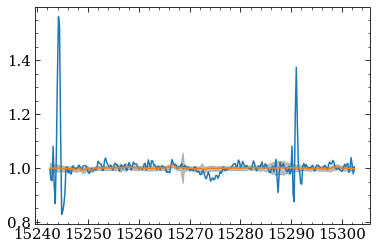

In [9]:
i = 5
fig, ax = plt.subplots()
ax.plot(wavs[window], residuals[i, :,0][window])
ax.plot(wavs[window], medresiduals[i, :, 0][window])
ax.fill_between(wavs[window], (medresiduals[i, :, 0] + medresiduals[i, :, 1])[window], (medresiduals[i, :, 0] - medresiduals[i, :, 1])[window], color = 'grey', alpha = 0.5)

0.04138961955904954

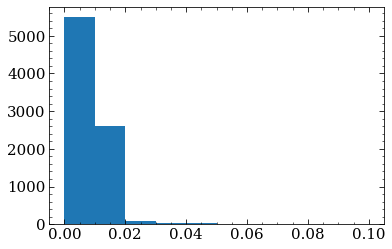

In [10]:
plt.hist(spectra[0, :, 1], range = (0, 0.1))
np.percentile(spectra[0, :, 1], 96)

2M04044802+3829564


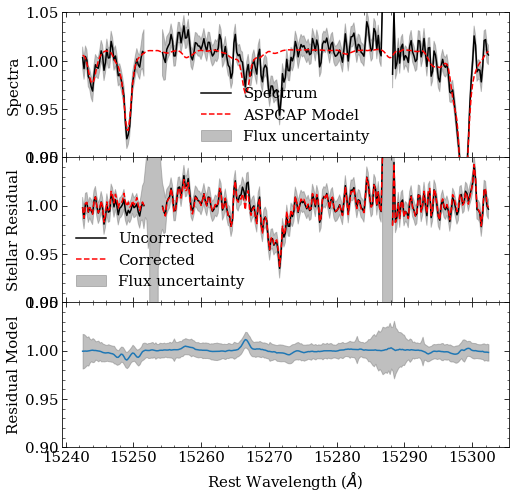

2M04085038+3501341


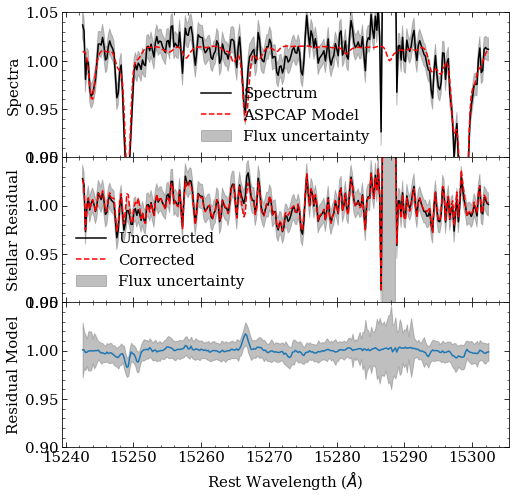

2M04110633+3437130


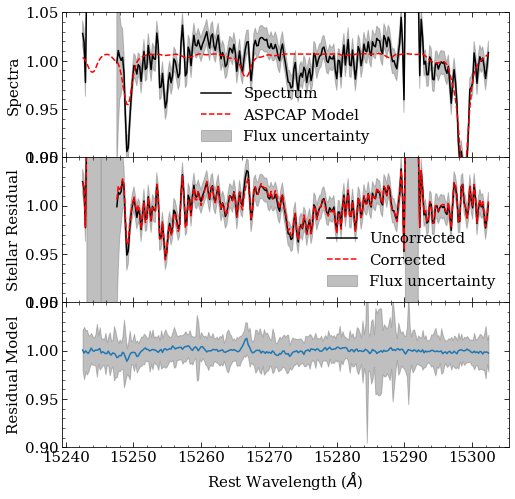

2M04131964+3536205


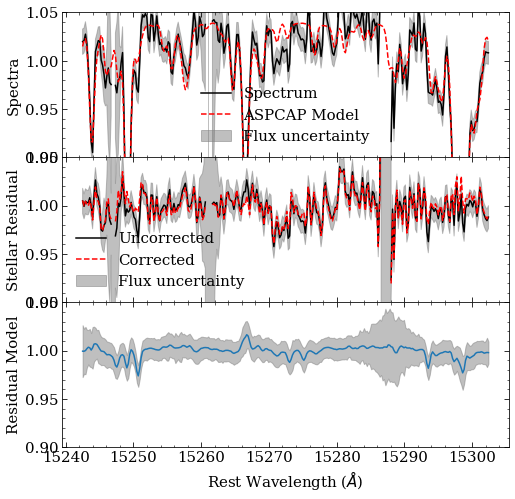

2M04153752+3612080


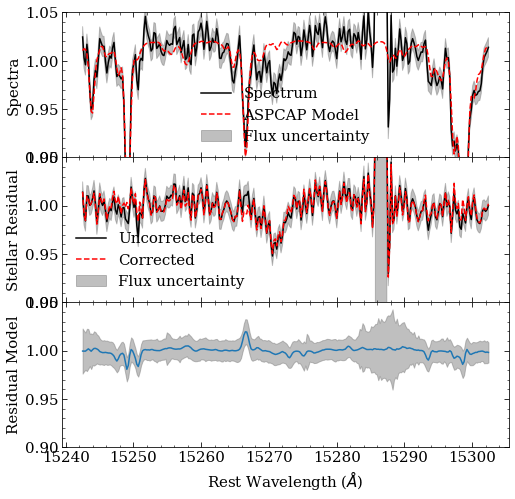

2M04172357+3915392


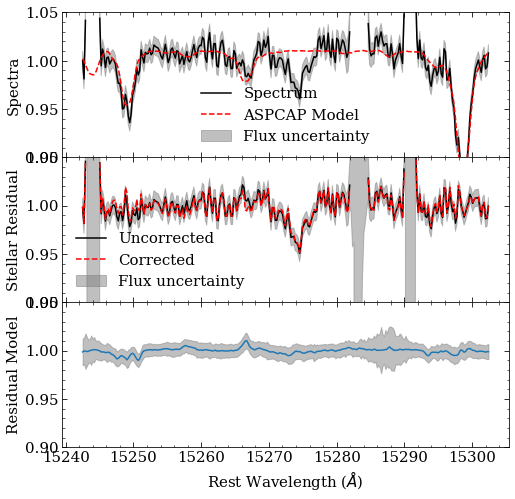

2M04192404+3647414


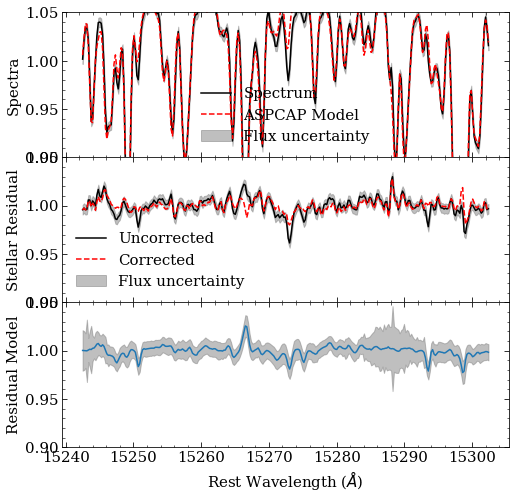

2M04205081+3550332


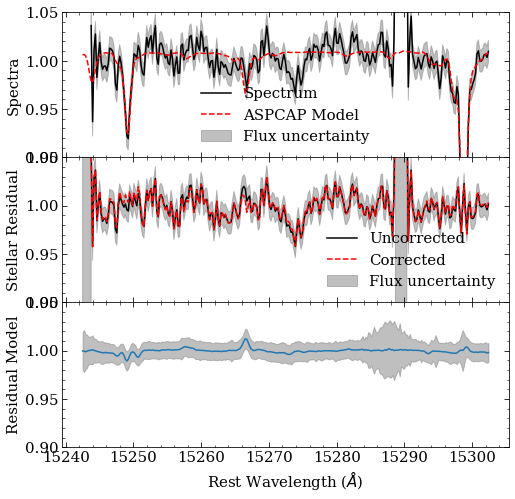

2M04220277+3747536


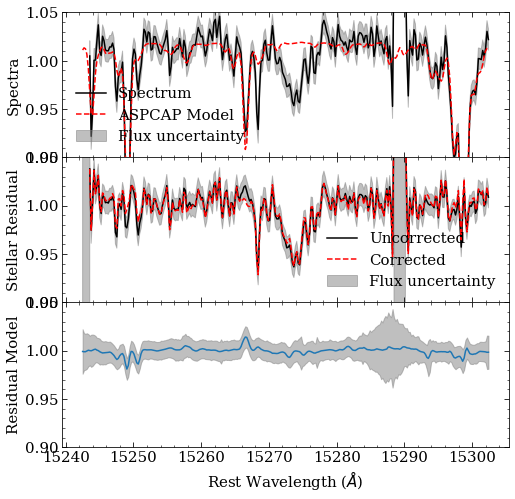

2M04233397+3756588


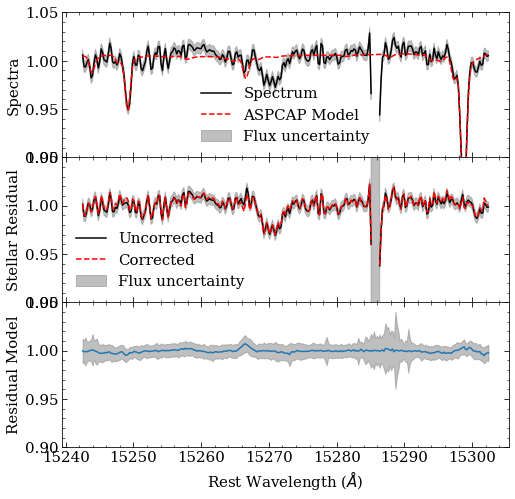

2M04245664+3450547


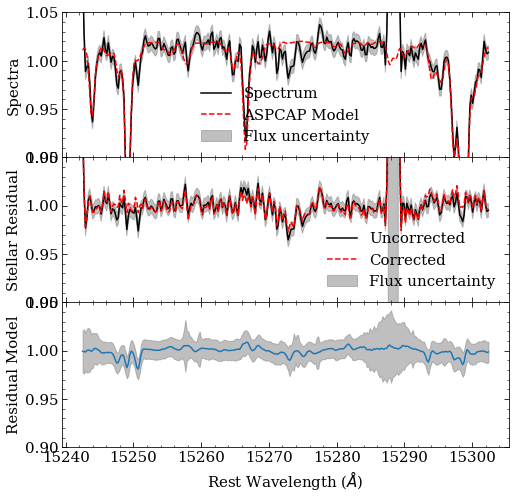

2M04262418+3958408


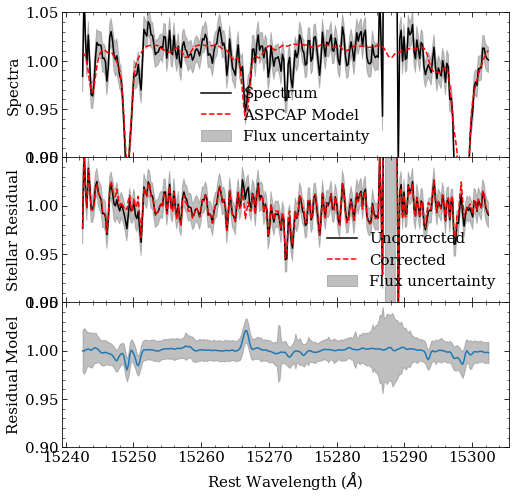

2M04275929+3838406


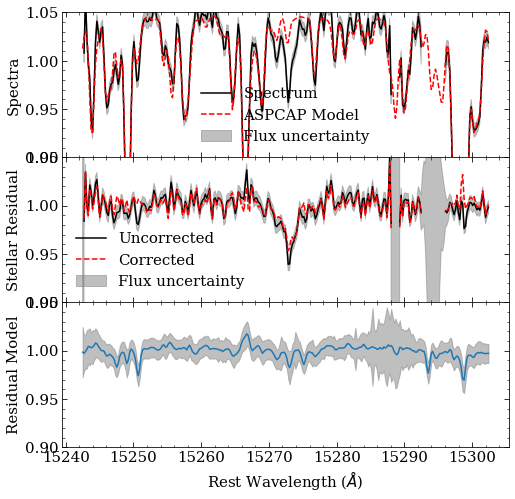

2M04292506+3351507


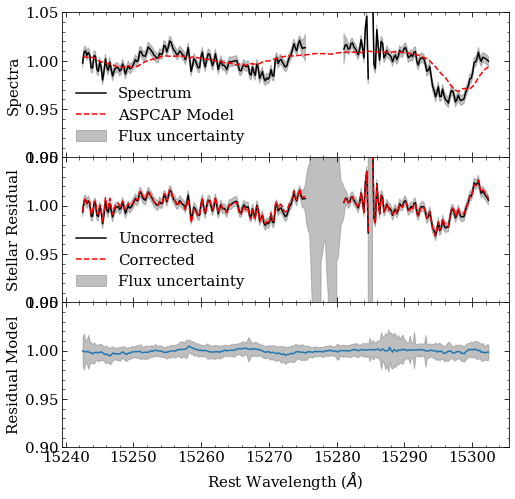

2M04303085+3636319


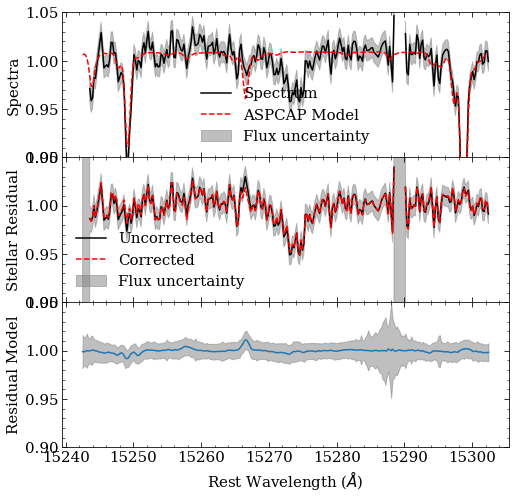

2M04322269+3908254


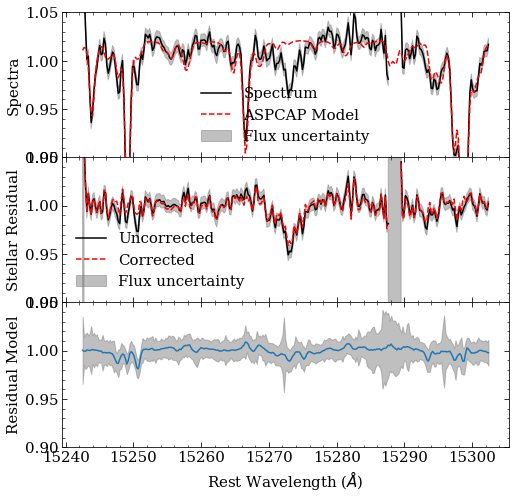

2M04341613+3813429


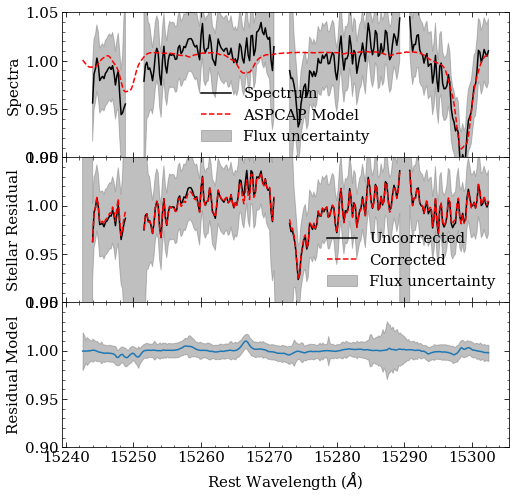

2M04371004+3925435


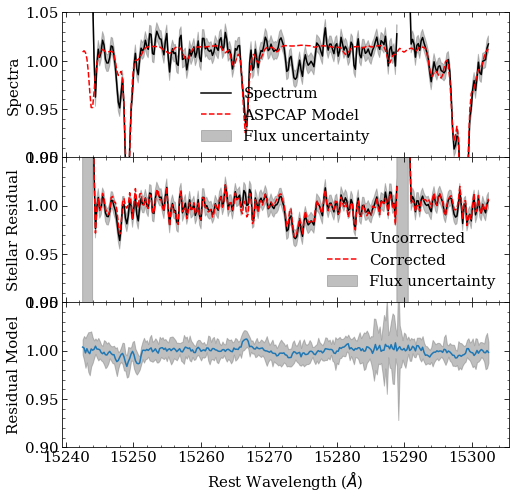

2M04395495+3633224


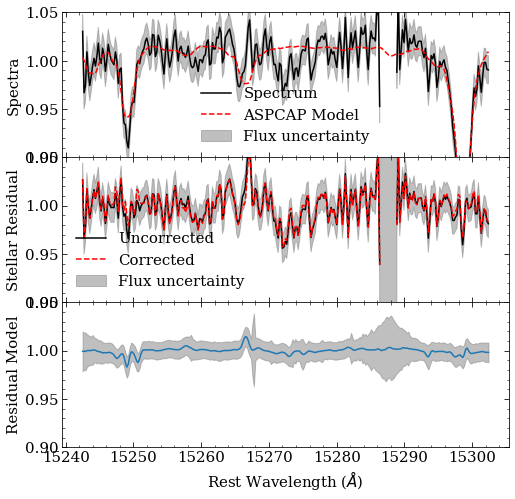

In [11]:
for i in range(0, len(CA_meta), 80):
    fig, axs = plt.subplots(nrows = 3, ncols = 1, figsize = (8,8), sharex = True, gridspec_kw = {'hspace':0})
    print(CA_meta['APOGEE_ID'][i])
    bitmask = spectra[i, :, 3].astype(int)
    mask_digits = [0, 1, 2, 9, 12, 13]
    mask = np.zeros(bitmask.shape)
    for digit in mask_digits:
        mask = mask + np.bitwise_and(bitmask.astype(int), 2**digit) 
    error_mask = spectra[i, :, 1] > np.percentile(spectra[i, :, 1], 95)
    mask = (mask + error_mask).astype(int)
    mask = mask.astype(int)
    spectrum = np.ma.array(spectra[i, :,0], mask = mask)

    axs[0].plot(wavs[window], spectrum[window], color = 'k', label = 'Spectrum')
    axs[0].plot(wavs[window], spectra[i, :, 2][window],  color = 'r', linestyle = 'dashed', label = 'ASPCAP Model')

    axs[0].fill_between(wavs[window], (spectrum + spectra[i, :, 1])[window], 
                    (spectrum - spectra[i, :, 1])[window], color = 'grey', alpha = 0.5, label = 'Flux uncertainty')
    axs[0].set_ylim(0.9, 1.05)
    axs[0].set_ylabel('Spectra')
    axs[0].legend()

    residual = np.ma.array(residuals[i, :, 0], mask = mask)
    axs[1].plot(wavs[window], residual[window], color = 'k', label = 'Uncorrected')
    axs[1].plot(wavs[window], residual[window] / medresiduals[i, :, 0][window], color = 'r', linestyle = 'dashed', label = 'Corrected')

    axs[1].fill_between(wavs[window], (residuals[i, :, 0] + residuals[i, :, 1])[window], 
                    (residuals[i, :, 0] - residuals[i, :, 1])[window], color = 'grey', alpha = 0.5, label = 'Flux uncertainty')
    axs[1].set_ylim(0.9, 1.05)
    axs[1].set_ylabel('Stellar Residual')
    axs[1].legend()

    axs[2].plot(wavs[window], medresiduals[i, :,0][window])
    axs[2].fill_between(wavs[window], (medresiduals[i, :, 0] + medresiduals[i, :, 1])[window], 
                    (medresiduals[i, :, 0] - medresiduals[i, :, 1])[window], color = 'grey', alpha = 0.5)
    axs[2].set_ylim(0.9, 1.05)
    axs[2].set_xlabel('Rest Wavelength ($\AA$)')
    axs[2].set_ylabel('Residual Model')
    plt.show()

In [12]:
skewness_array = np.zeros(len(CA_meta))

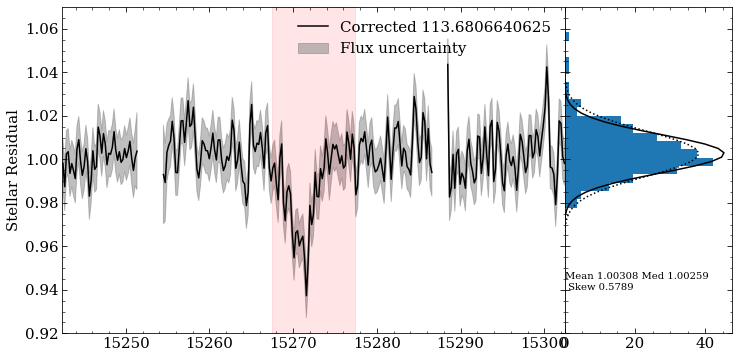

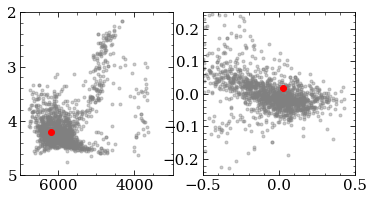

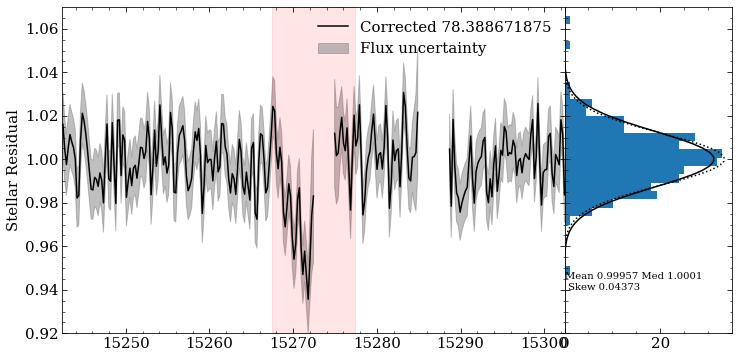

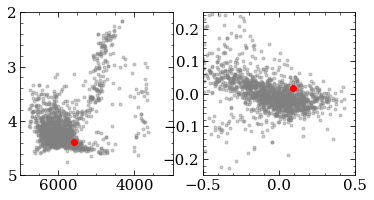

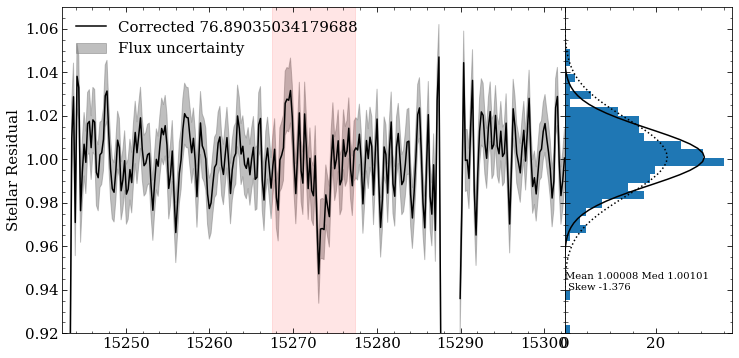

...

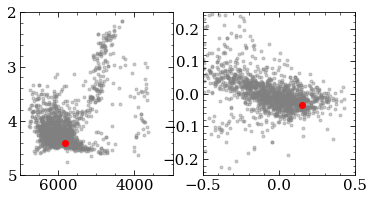

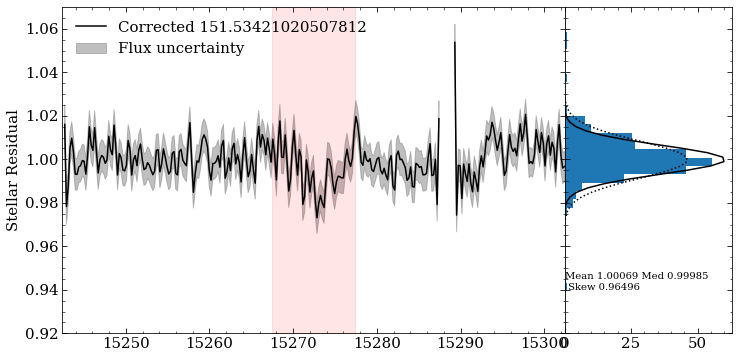

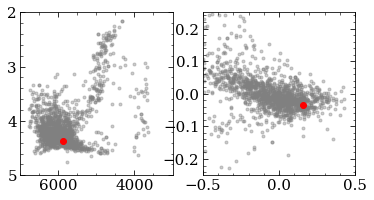

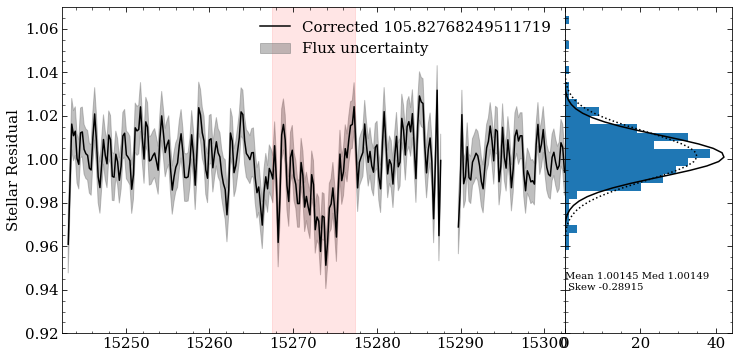

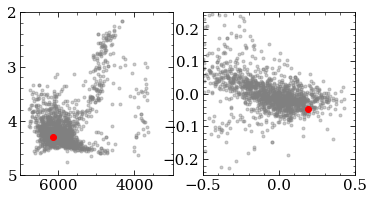

/tmp/ipykernel_161208/2710436730.py:20: RuntimeWarning: divide by zero encountered in true_divide
  residual = np.ma.array(residuals[i, :, 0]/medresiduals[i, :, 0], mask = mask)


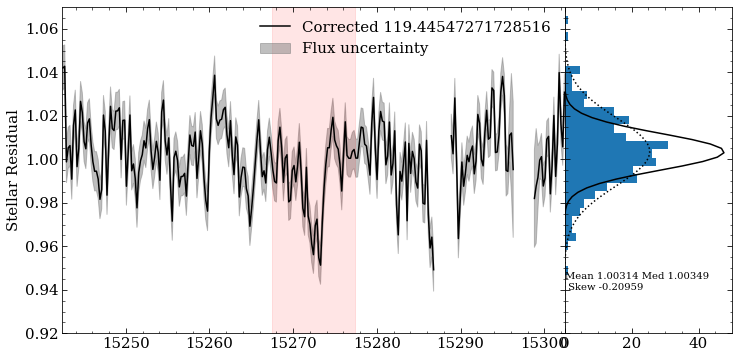

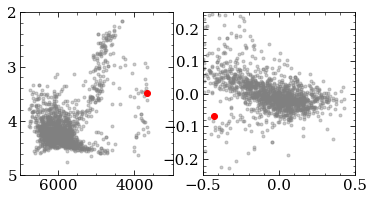

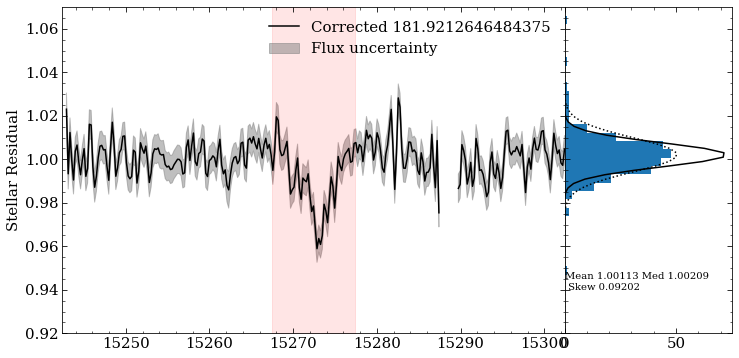

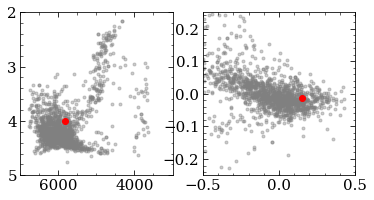

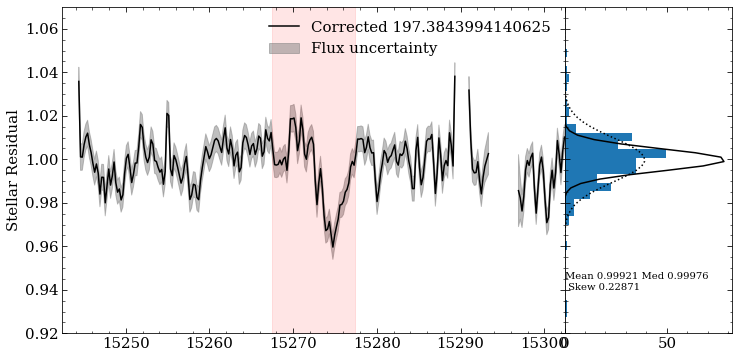

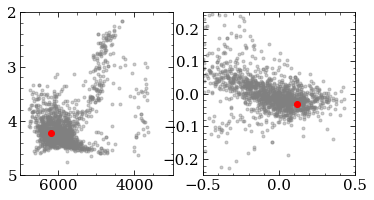

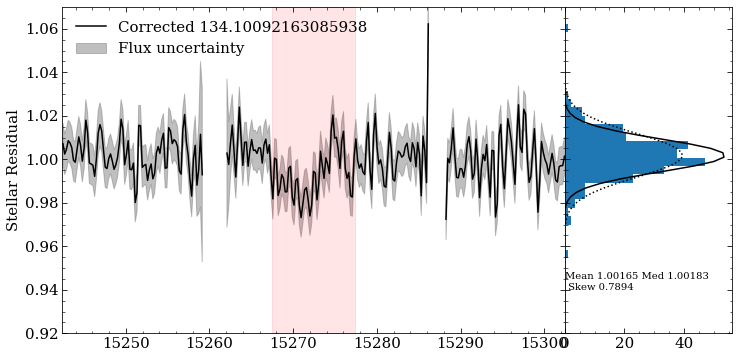

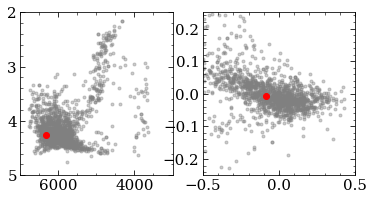

In [13]:
window_r = 5
noDIBwindow = ((wavs < lambda0-window_r) | (wavs > lambda0+window_r)) & window
for i in range(0, len(CA_meta), 100):
    star = CA_meta[i]
    if star['SNR'] < 70:
        continue
    fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (12,6), sharey = True, gridspec_kw = {'wspace':0, 'width_ratios':(3,1)})

    bitmask = spectra[i, :, 3].astype(int)
    mask_digits = [0, 1, 2, 9, 12, 13]
    mask = np.zeros(bitmask.shape)
    for digit in mask_digits:
        mask = mask + np.bitwise_and(bitmask.astype(int), 2**digit) 
    error_mask = spectra[i, :, 1] > np.percentile(spectra[i, :, 1], 95)
    mask = (mask + error_mask).astype(int)
    mask = mask.astype(bool)
    mask = (mask + np.roll(mask, 1) + np.roll(mask, -1)).astype(bool)

    snr = star['SNR']
    residual = np.ma.array(residuals[i, :, 0]/medresiduals[i, :, 0], mask = mask)
    axs[0].plot(wavs[window], residual[window] , color = 'k', linestyle = 'solid', label = 'Corrected {}'.format(snr))
    # axs[0].plot(wavs[window], residual[window], color = 'r', linestyle = 'dashed', label = 'Uncorrected')


    axs[0].fill_between(wavs[window], (residual + residuals[i, :, 1])[window], 
                    (residual - residuals[i, :, 1])[window], color = 'grey', alpha = 0.5, label = 'Flux uncertainty')
    axs[0].set_ylim(0.92, 1.07)
    axs[0].set_ylabel('Stellar Residual')
    axs[0].legend()
    axs[0].fill_between((lambda0-window_r,lambda0+window_r), (1.07, 1.07), (0.92,0.92), color='r', alpha = 0.1)
    axs[0].set_xlim(lambda0 - 30, lambda0 + 30)

    residual_filled = residual.filled(np.nan)
    continuum_mean = np.nanmean(residual_filled[noDIBwindow])
    continuum_median = np.nanmedian(residual_filled[noDIBwindow])
    sig_empirical = np.nanstd(residual_filled[noDIBwindow], ddof = 1)

    skewness = skew(residual_filled[noDIBwindow], nan_policy = 'omit')

    mu = 1
    mu = continuum_median
    sig = 1/star['SNR']


    y = np.linspace(0.9, 1.1, 100) 
    x = 1 / (sig * np.sqrt(2 * np.pi )) * np.exp(-(y - mu)**2 / (2 * sig**2))
    # sig_empirical = np.nanstd(np.ma.array(residuals[i, :, 1], mask = mask)[noDIBwindow], ddof = 1)
    x_empirical = 1 / (sig_empirical * np.sqrt(2 * np.pi )) * np.exp(-(y - mu)**2 / (2 * sig_empirical**2))

    axs[1].hist(residual[noDIBwindow], orientation = 'horizontal', density = True, bins = np.linspace(0.92, 1.07, 40))
    # axs[1].set_xlim(0,)
    axs[1].text(0.01, 0.94, 'Mean {s1} Med {s2} \n Skew {s3}'.format(s1 = np.round(continuum_mean, 5), s2 = np.round(continuum_median, 5), s3 = np.round(skewness, 5)))
    axs[1].plot(x, y, linestyle = 'solid', color = 'k', label = "Predicted")
    axs[1].plot(x_empirical, y, linestyle = 'dotted', color = 'k', label = 'Empirical')


    plt.show()

    fig, axs = plt.subplots(figsize = (6,3), nrows = 1, ncols =2)
    axs[0].scatter(CA_meta['TEFF'], CA_meta['LOGG'], c = 'grey', alpha = 0.4, marker = '.')
    axs[0].scatter(star['TEFF'], star['LOGG'], c = 'r',)
    axs[0].set_xlim(7000, 3000)
    axs[0].set_ylim(5,2)

    axs[1].scatter(CA_meta['M_H'], CA_meta['ALPHA_M'], c = 'grey', alpha = 0.4, marker = '.')
    axs[1].scatter(star['M_H'], star['ALPHA_M'], c = 'r',)
    axs[1].set_xlim(-0.5, 0.5)
    axs[1].set_ylim(-0.25,0.25)
    plt.show()

In [14]:
skewness_array = np.zeros(len(CA_meta))
std_array = np.zeros(len(CA_meta))
for i in range(0, len(CA_meta)):
    star = CA_meta[i]
    # fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (12,6), sharey = True, gridspec_kw = {'wspace':0, 'width_ratios':(3,1)})

    bitmask = spectra[i, :, 3].astype(int)
    mask_digits = [0, 1, 2, 9, 12, 13]
    mask = np.zeros(bitmask.shape)
    for digit in mask_digits:
        mask = mask + np.bitwise_and(bitmask.astype(int), 2**digit) 
    error_mask = spectra[i, :, 1] > np.percentile(spectra[i, :, 1], 95)
    mask = (mask + error_mask).astype(int)
    mask = mask.astype(bool)
    mask = (mask + np.roll(mask, 1) + np.roll(mask, -1)).astype(bool)


    residual = np.ma.array(residuals[i, :, 0] / medresiduals[i, :, 0], mask = mask)
    residual_filled = residual.filled(np.nan)
    continuum_mean = np.nanmean(residual_filled[noDIBwindow])
    continuum_median = np.nanmedian(residual_filled[noDIBwindow])
    sig_empirical = np.nanstd(residual_filled[noDIBwindow], ddof = 1)

    skewness = skew(residual_filled[noDIBwindow], nan_policy = 'omit')
    skewness_array[i] = skewness
    std_array[i] = sig_empirical

/tmp/ipykernel_161208/4028150801.py:18: RuntimeWarning: divide by zero encountered in true_divide
  residual = np.ma.array(residuals[i, :, 0] / medresiduals[i, :, 0], mask = mask)
/tmp/ipykernel_161208/4028150801.py:20: RuntimeWarning: Mean of empty slice
  continuum_mean = np.nanmean(residual_filled[noDIBwindow])
/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/numpy-1.22.3-py3.10-linux-x86_64.egg/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/numpy-1.22.3-py3.10-linux-x86_64.egg/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_161208/4028150801.py:25: UserWarning: Warning: converting a masked element to nan.
  skewness_array[i] = skewness
/uufs/chpc.utah.edu/sys/inst

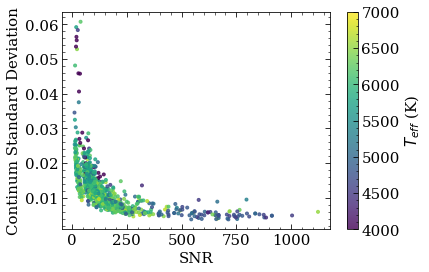

In [15]:
fig, ax = plt.subplots()
bad = CA_meta['GOODBAD'] == False
points = ax.scatter(CA_meta['SNR'], std_array, marker = '.', c = CA_meta['TEFF'], alpha = 0.8, vmin = 4000, vmax = 7000)
# ax.scatter(CA_meta['SNR'][bad], std_array[bad], color = 'r', alpha = 0.4)
ax.set_xlabel('SNR')
ax.set_ylabel('Continum Standard Deviation')
fig.colorbar(points, label = '$T_{eff}$ (K)')
fig.set_facecolor('white')
plt.show()

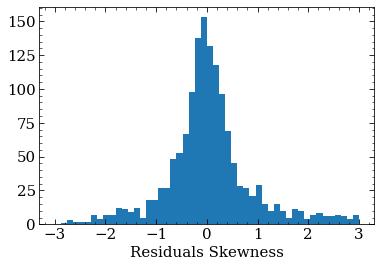

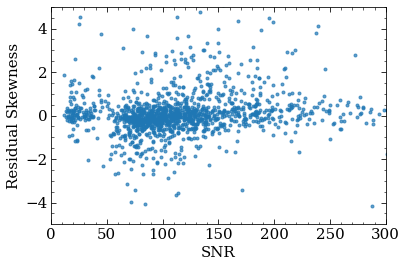

In [16]:
fig, ax = plt.subplots()
ax.hist(skewness_array, range = (-3, 3), bins = 50)
ax.set_xlabel('Residuals Skewness')
plt.show()

fig, ax = plt.subplots()
ax.scatter(CA_meta['SNR'], skewness_array, marker = '.', alpha = 0.7)
ax.set_xlim(0, 300)
ax.set_ylim(-5,5)
ax.set_xlabel("SNR")
ax.set_ylabel("Residual Skewness")
plt.show()

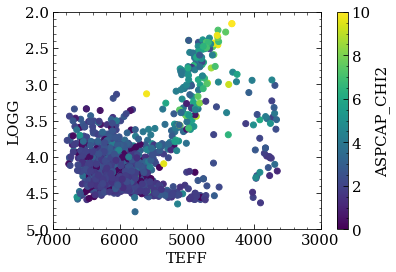

In [17]:
fig, ax = plt.subplots()
points = ax.scatter(CA_meta['TEFF'], CA_meta['LOGG'], c = CA_meta['ASPCAP_CHI2'], vmin = 0, vmax = 10)
ax.set_xlim(7e3, 3e3)
ax.set_ylim(5,2)
ax.set_xlabel('TEFF')
ax.set_ylabel('LOGG')
fig.colorbar(points, label = 'ASPCAP_CHI2')
plt.show()

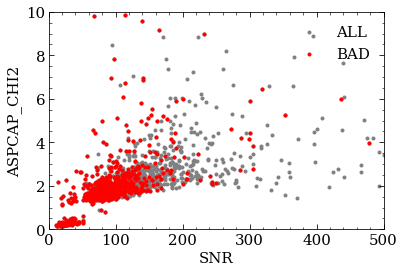

In [18]:
fig, ax = plt.subplots()
bad = CA_meta['GOODBAD'] == False
ax.scatter(CA_meta['SNR'], CA_meta['ASPCAP_CHI2'], marker = '.', c = 'grey', label = 'ALL')
ax.scatter(CA_meta['SNR'][bad], CA_meta['ASPCAP_CHI2'][bad], marker = '.', c = 'r', label = 'BAD')

ax.set_ylim(0, 10)
ax.set_xlim(0, 500)
ax.set_xlabel('SNR')
ax.set_ylabel('ASPCAP_CHI2')
ax.legend()
plt.show()

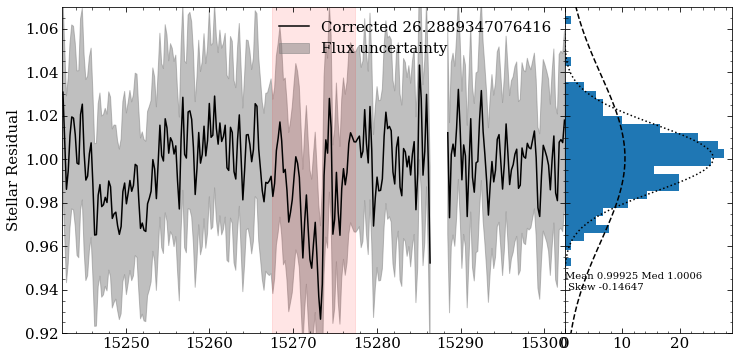

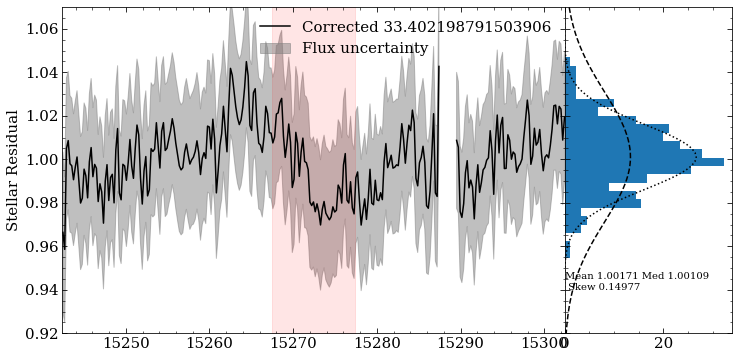

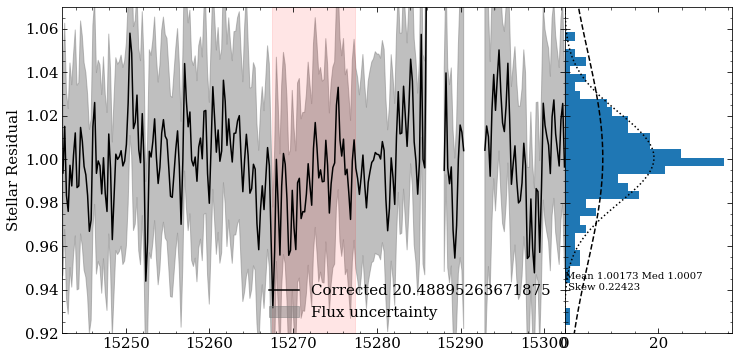

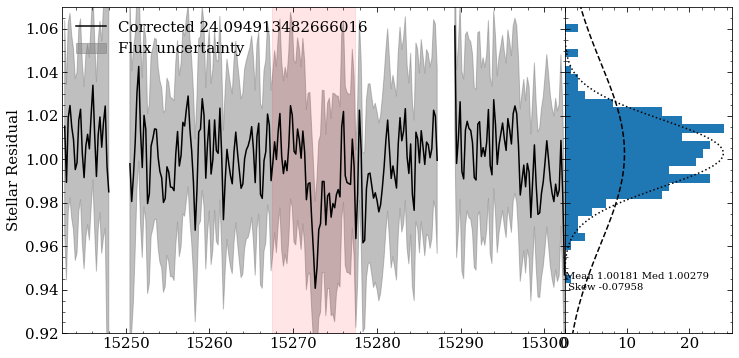

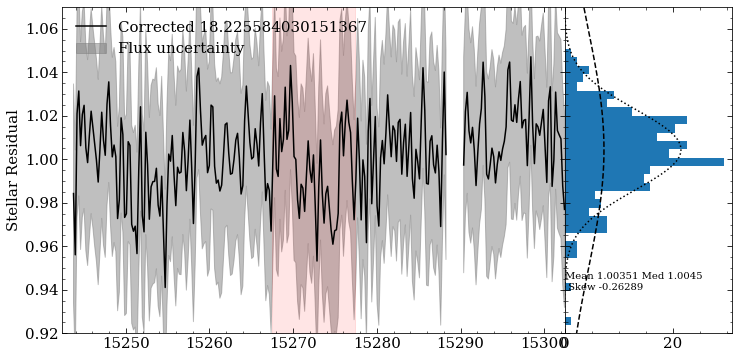

...

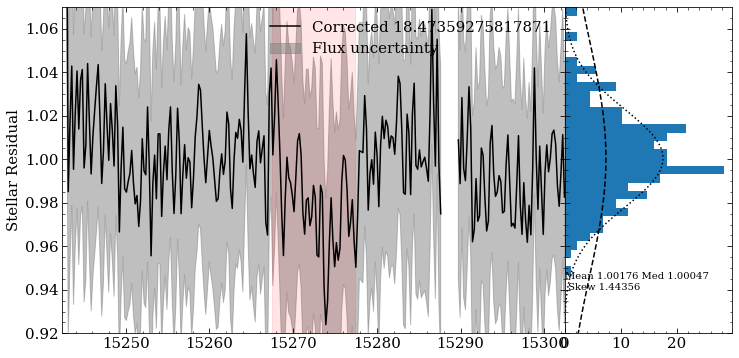

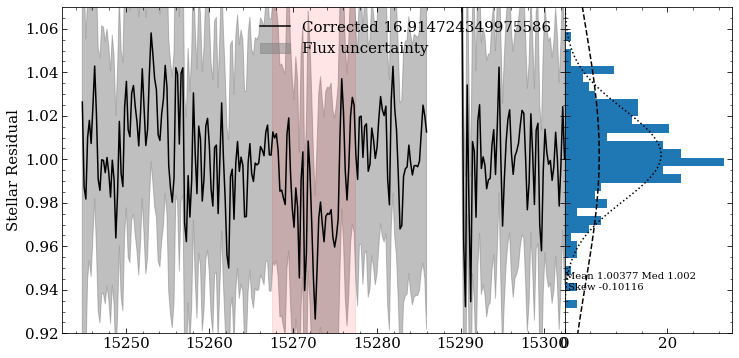

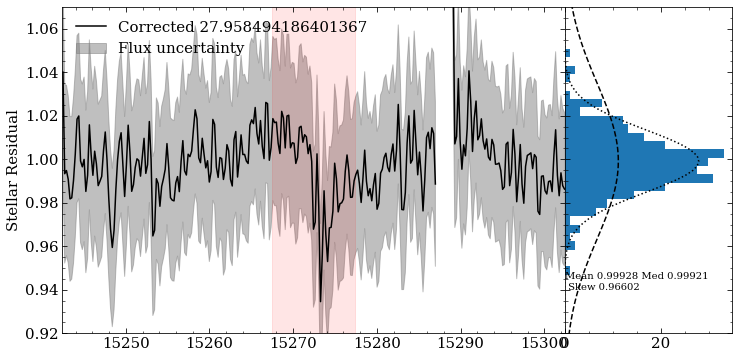

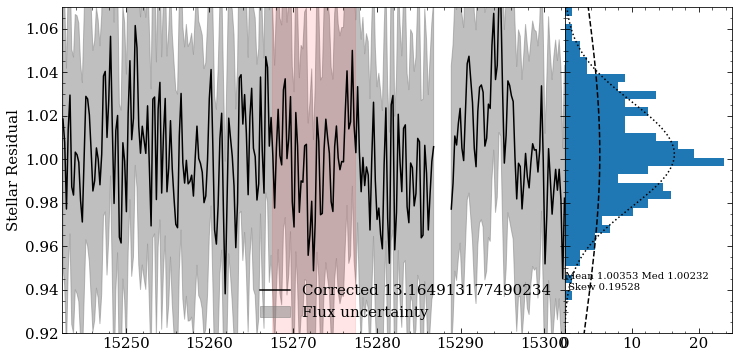

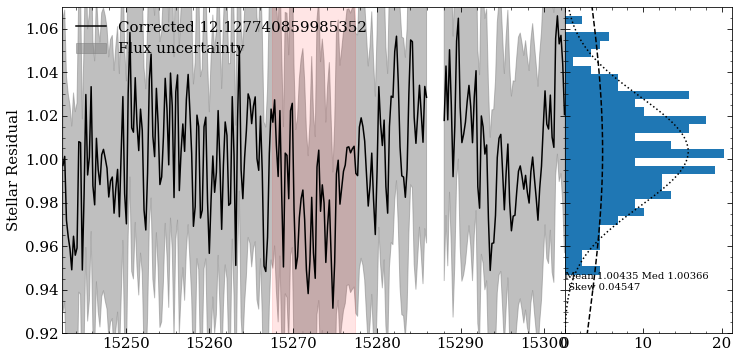

In [19]:
# weird_sample = CA_meta[(CA_meta['ASPCAP_CHI2'] <1) & (CA_meta['SNR'] <50)]
weird_sample = np.arange(len(CA_meta))[(CA_meta['ASPCAP_CHI2'] <1) & (CA_meta['SNR'] <50)]
for i in weird_sample[::10]:
    star = CA_meta[i]
    fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (12,6), sharey = True, gridspec_kw = {'wspace':0, 'width_ratios':(3,1)})

    bitmask = spectra[i, :, 3].astype(int)
    mask_digits = [0, 1, 2, 9, 12, 13]
    mask = np.zeros(bitmask.shape)
    for digit in mask_digits:
        mask = mask + np.bitwise_and(bitmask.astype(int), 2**digit) 
    error_mask = spectra[i, :, 1] > np.percentile(spectra[i, :, 1], 95)
    mask = (mask + error_mask).astype(int)
    mask = mask.astype(bool)
    mask = (mask + np.roll(mask, 1) + np.roll(mask, -1)).astype(bool)

    snr = star['SNR']
    residual = np.ma.array(residuals[i, :, 0]/medresiduals[i, :, 0], mask = mask)
    axs[0].plot(wavs[window], residual[window] , color = 'k', linestyle = 'solid', label = 'Corrected {}'.format(snr))
    # axs[0].plot(wavs[window], residual[window], color = 'r', linestyle = 'dashed', label = 'Uncorrected')


    axs[0].fill_between(wavs[window], (residual + residuals[i, :, 1])[window], 
                    (residual - residuals[i, :, 1])[window], color = 'grey', alpha = 0.5, label = 'Flux uncertainty')
    axs[0].set_ylim(0.92, 1.07)
    axs[0].set_ylabel('Stellar Residual')
    axs[0].legend()
    axs[0].fill_between((lambda0-window_r,lambda0+window_r), (1.07, 1.07), (0.92,0.92), color='r', alpha = 0.1)
    axs[0].set_xlim(lambda0 - 30, lambda0 + 30)

    residual_filled = residual.filled(np.nan)
    continuum_mean = np.nanmean(residual_filled[noDIBwindow])
    continuum_median = np.nanmedian(residual_filled[noDIBwindow])
    sig_empirical = np.nanstd(residual_filled[noDIBwindow], ddof = 1)
    skewness = skew(residual_filled[noDIBwindow], nan_policy = 'omit')

    mu = 1
    mu = continuum_median
    sig = 1/star['SNR']

    y = np.linspace(0.9, 1.1, 100) 
    x = 1 / (sig * np.sqrt(2 * np.pi )) * np.exp(-(y - mu)**2 / (2 * sig**2))
    x_empirical = 1 / (sig_empirical * np.sqrt(2 * np.pi )) * np.exp(-(y - mu)**2 / (2 * sig_empirical**2))

    axs[1].hist(residual[noDIBwindow], orientation = 'horizontal', density = True, bins = np.linspace(0.92, 1.07, 40))
    # axs[1].set_xlim(0,)
    axs[1].text(0.01, 0.94, 'Mean {s1} Med {s2} \n Skew {s3}'.format(s1 = np.round(continuum_mean, 5), s2 = np.round(continuum_median, 5), s3 = np.round(skewness, 5)))
    axs[1].plot(x, y, linestyle = 'dashed', color = 'k')
    axs[1].plot(x_empirical, y, linestyle = 'dotted', color = 'k')


    plt.show()

/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/numpy-1.22.3-py3.10-linux-x86_64.egg/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


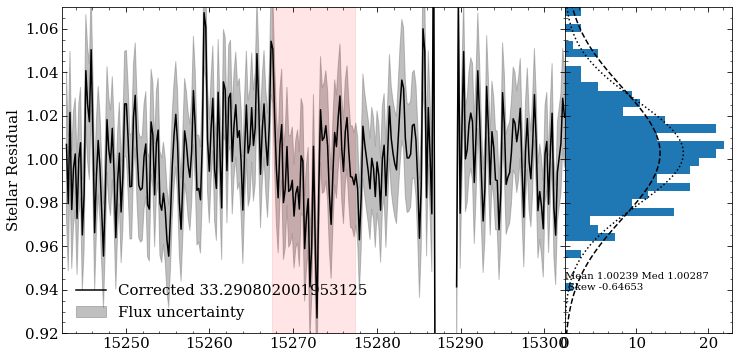

/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/numpy-1.22.3-py3.10-linux-x86_64.egg/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


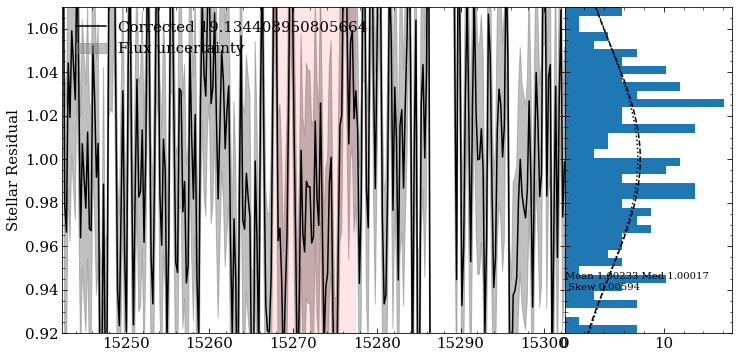

/tmp/ipykernel_161208/246641471.py:32: RuntimeWarning: Mean of empty slice
  continuum_mean = np.nanmean(residual_filled[noDIBwindow])
/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/numpy-1.22.3-py3.10-linux-x86_64.egg/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/numpy-1.22.3-py3.10-linux-x86_64.egg/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/matplotlib-3.5.1-py3.10-linux-x86_64.egg/matplotlib/axes/_axes.py:6611: RuntimeWarning: All-NaN axis encountered
  xmin = min(xmin, np.nanmin(xi))
/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/matplotlib-3

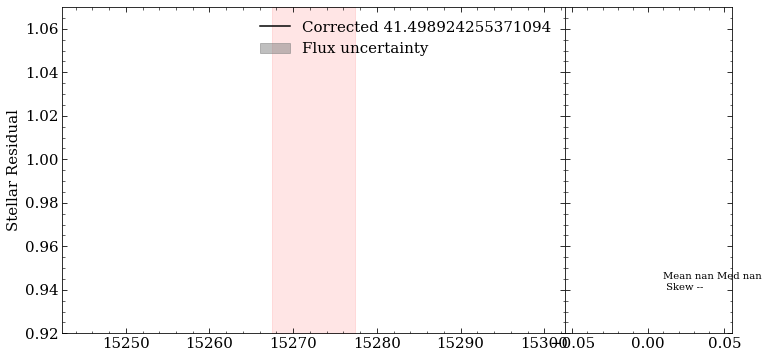

/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/numpy-1.22.3-py3.10-linux-x86_64.egg/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


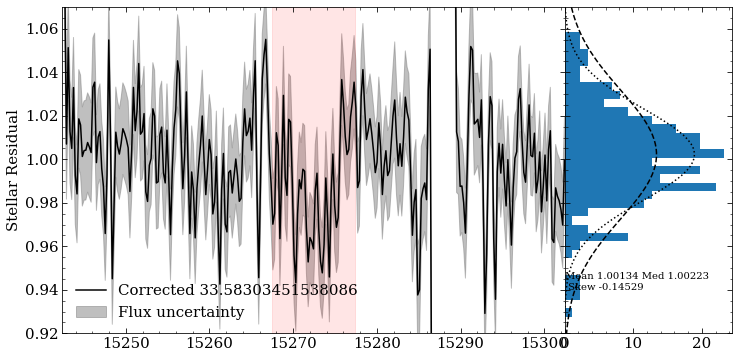

In [20]:
weird_sample_2 = CA_meta[(CA_meta['ASPCAP_CHI2'] >= 1) & (CA_meta['SNR'] <70)]
weird_sample_2 = np.arange(len(CA_meta))[(CA_meta['ASPCAP_CHI2'] >= 1) & (CA_meta['SNR'] <50)]
for i in weird_sample_2[::5]:
    star = CA_meta[i]
    fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (12,6), sharey = True, gridspec_kw = {'wspace':0, 'width_ratios':(3,1)})

    bitmask = spectra[i, :, 3].astype(int)
    mask_digits = [0, 1, 2, 9, 12, 13]
    mask = np.zeros(bitmask.shape)
    for digit in mask_digits:
        mask = mask + np.bitwise_and(bitmask.astype(int), 2**digit) 
    error_mask = spectra[i, :, 1] > np.percentile(spectra[i, :, 1], 95)
    mask = (mask + error_mask).astype(int)
    mask = mask.astype(bool)
    mask = (mask + np.roll(mask, 1) + np.roll(mask, -1)).astype(bool)

    snr = star['SNR']
    residual = np.ma.array(residuals[i, :, 0]/medresiduals[i, :, 0], mask = mask)
    axs[0].plot(wavs[window], residual[window] , color = 'k', linestyle = 'solid', label = 'Corrected {}'.format(snr))
    # axs[0].plot(wavs[window], residual[window], color = 'r', linestyle = 'dashed', label = 'Uncorrected')


    axs[0].fill_between(wavs[window], (residual + residuals[i, :, 1])[window], 
                    (residual - residuals[i, :, 1])[window], color = 'grey', alpha = 0.5, label = 'Flux uncertainty')
    axs[0].set_ylim(0.92, 1.07)
    axs[0].set_ylabel('Stellar Residual')
    axs[0].legend()
    axs[0].fill_between((lambda0-window_r,lambda0+window_r), (1.07, 1.07), (0.92,0.92), color='r', alpha = 0.1)
    axs[0].set_xlim(lambda0 - 30, lambda0 + 30)

    residual_filled = residual.filled(np.nan)
    continuum_mean = np.nanmean(residual_filled[noDIBwindow])
    continuum_median = np.nanmedian(residual_filled[noDIBwindow])
    skewness = skew(residual_filled[noDIBwindow], nan_policy = 'omit')

    mu = 1
    mu = continuum_median
    sig = 1/star['SNR']

    y = np.linspace(0.9, 1.1, 100) 
    x = 1 / (sig * np.sqrt(2 * np.pi )) * np.exp(-(y - mu)**2 / (2 * sig**2))
    sig_empirical = np.nanmedian(np.ma.array(residuals[i, :, 1], mask = mask)[window])
    x_empirical = 1 / (sig_empirical * np.sqrt(2 * np.pi )) * np.exp(-(y - mu)**2 / (2 * sig_empirical**2))

    axs[1].hist(residual[noDIBwindow], orientation = 'horizontal', density = True, bins = np.linspace(0.92, 1.07, 40))
    # axs[1].set_xlim(0,)
    axs[1].text(0.01, 0.94, 'Mean {s1} Med {s2} \n Skew {s3}'.format(s1 = np.round(continuum_mean, 5), s2 = np.round(continuum_median, 5), s3 = np.round(skewness, 5)))
    axs[1].plot(x, y, linestyle = 'dashed', color = 'k')
    axs[1].plot(x_empirical, y, linestyle = 'dotted', color = 'k')


    plt.show()

3905.9026


/tmp/ipykernel_161208/904099516.py:20: RuntimeWarning: divide by zero encountered in true_divide
  residual = np.ma.array(residuals[i, :, 0]/medresiduals[i, :, 0], mask = mask)


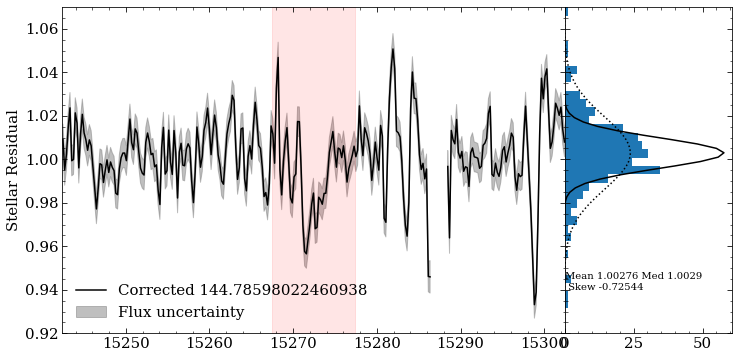

3906.1445


/tmp/ipykernel_161208/904099516.py:20: RuntimeWarning: divide by zero encountered in true_divide
  residual = np.ma.array(residuals[i, :, 0]/medresiduals[i, :, 0], mask = mask)
/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/numpy-1.22.3-py3.10-linux-x86_64.egg/numpy/lib/nanfunctions.py:1741: RuntimeWarning: invalid value encountered in subtract
  np.subtract(arr, avg, out=arr, casting='unsafe', where=where)
/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/numpy-1.22.3-py3.10-linux-x86_64.egg/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


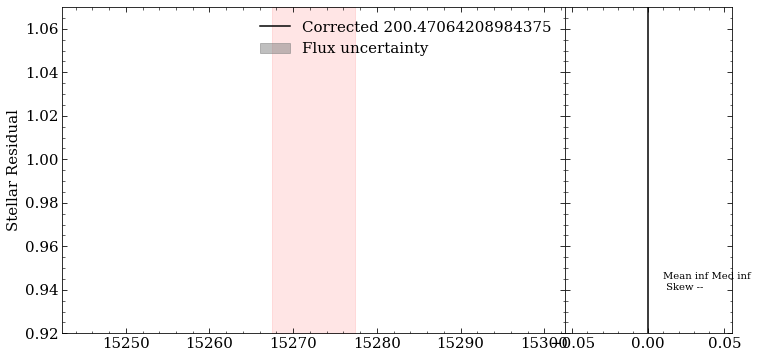

3685.5894


/tmp/ipykernel_161208/904099516.py:20: RuntimeWarning: divide by zero encountered in true_divide
  residual = np.ma.array(residuals[i, :, 0]/medresiduals[i, :, 0], mask = mask)


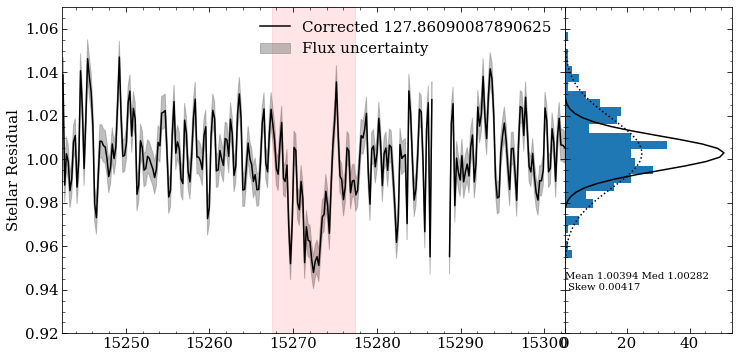

3726.138


/tmp/ipykernel_161208/904099516.py:34: RuntimeWarning: Mean of empty slice
  continuum_mean = np.nanmean(residual_filled[noDIBwindow])
/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/numpy-1.22.3-py3.10-linux-x86_64.egg/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/numpy-1.22.3-py3.10-linux-x86_64.egg/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/matplotlib-3.5.1-py3.10-linux-x86_64.egg/matplotlib/axes/_axes.py:6611: RuntimeWarning: All-NaN axis encountered
  xmin = min(xmin, np.nanmin(xi))
/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/matplotlib-3.5.1-py3.10-linux

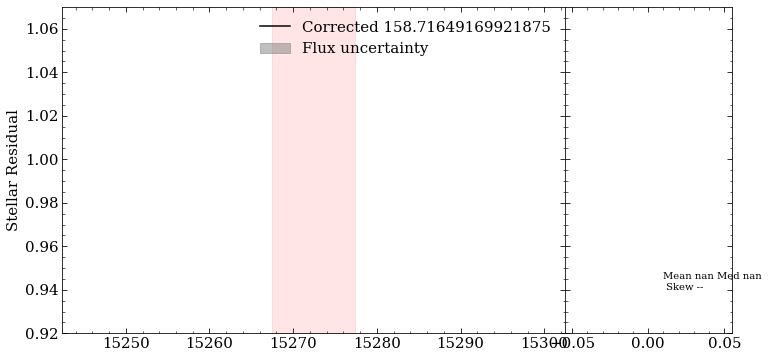

In [21]:
# weird_sample_3 = CA_meta[(CA_meta['TEFF'] < 4e3) & (CA_meta['SNR'] <)]
weird_sample_3 = np.arange(len(CA_meta))[(CA_meta['TEFF'] < 4e3) & (CA_meta['SNR'] > 120)]

for i in weird_sample_3[::2]:
    star = CA_meta[i]
    print(star['TEFF'])
    fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (12,6), sharey = True, gridspec_kw = {'wspace':0, 'width_ratios':(3,1)})

    bitmask = spectra[i, :, 3].astype(int)
    mask_digits = [0, 1, 2, 9, 12, 13]
    mask = np.zeros(bitmask.shape)
    for digit in mask_digits:
        mask = mask + np.bitwise_and(bitmask.astype(int), 2**digit) 
    error_mask = spectra[i, :, 1] > np.percentile(spectra[i, :, 1], 95)
    mask = (mask + error_mask).astype(int)
    mask = mask.astype(bool)
    mask = (mask + np.roll(mask, 1) + np.roll(mask, -1)).astype(bool)

    snr = star['SNR']
    residual = np.ma.array(residuals[i, :, 0]/medresiduals[i, :, 0], mask = mask)
    axs[0].plot(wavs[window], residual[window] , color = 'k', linestyle = 'solid', label = 'Corrected {}'.format(snr))
    # axs[0].plot(wavs[window], residual[window], color = 'r', linestyle = 'dashed', label = 'Uncorrected')


    axs[0].fill_between(wavs[window], (residual + residuals[i, :, 1])[window], 
                    (residual - residuals[i, :, 1])[window], color = 'grey', alpha = 0.5, label = 'Flux uncertainty')
    axs[0].set_ylim(0.92, 1.07)
    axs[0].set_ylabel('Stellar Residual')
    axs[0].legend()
    axs[0].fill_between((lambda0-window_r,lambda0+window_r), (1.07, 1.07), (0.92,0.92), color='r', alpha = 0.1)
    axs[0].set_xlim(lambda0 - 30, lambda0 + 30)

    residual_filled = residual.filled(np.nan)
    continuum_mean = np.nanmean(residual_filled[noDIBwindow])
    continuum_median = np.nanmedian(residual_filled[noDIBwindow])
    sig_empirical = np.nanstd(residual_filled[noDIBwindow], ddof = 1)
    skewness = skew(residual_filled[noDIBwindow], nan_policy = 'omit')

    mu = 1
    mu = continuum_median
    sig = 1/star['SNR']

    y = np.linspace(0.9, 1.1, 100) 
    x = 1 / (sig * np.sqrt(2 * np.pi )) * np.exp(-(y - mu)**2 / (2 * sig**2))
    x_empirical = 1 / (sig_empirical * np.sqrt(2 * np.pi )) * np.exp(-(y - mu)**2 / (2 * sig_empirical**2))

    axs[1].hist(residual[noDIBwindow], orientation = 'horizontal', density = True, bins = np.linspace(0.92, 1.07, 40))
    # axs[1].set_xlim(0,)
    axs[1].text(0.01, 0.94, 'Mean {s1} Med {s2} \n Skew {s3}'.format(s1 = np.round(continuum_mean, 5), s2 = np.round(continuum_median, 5), s3 = np.round(skewness, 5)))
    axs[1].plot(x, y, linestyle = 'solid', color = 'k', label = 'Theoretical')
    axs[1].plot(x_empirical, y, linestyle = 'dotted', color = 'k', label = 'Empirical')


    plt.show()

5845.1694


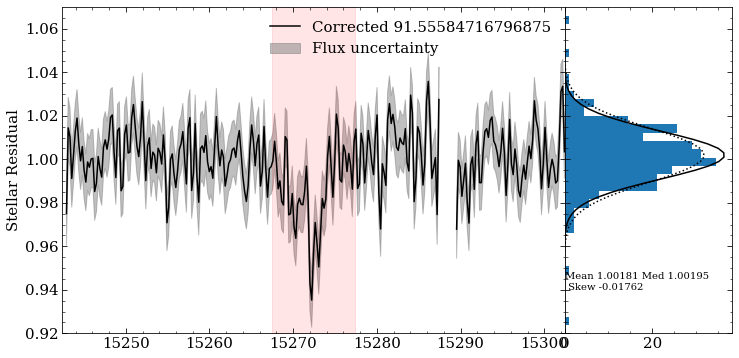

6572.881


/tmp/ipykernel_161208/761741092.py:18: RuntimeWarning: divide by zero encountered in true_divide
  residual = np.ma.array(residuals[i, :, 0]/medresiduals[i, :, 0], mask = mask)


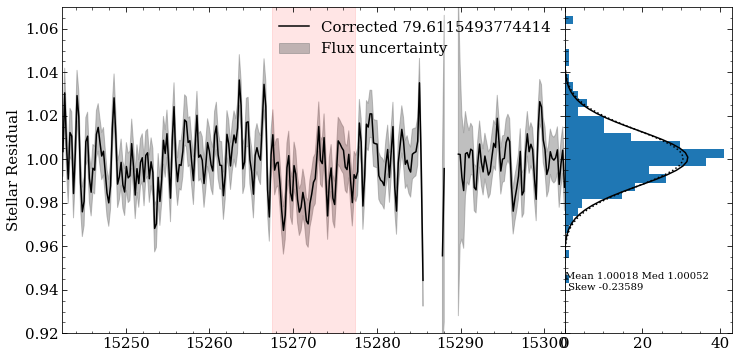

5798.4976


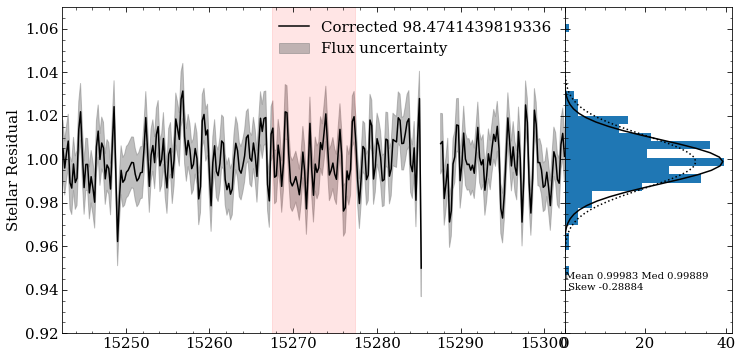

5633.6533


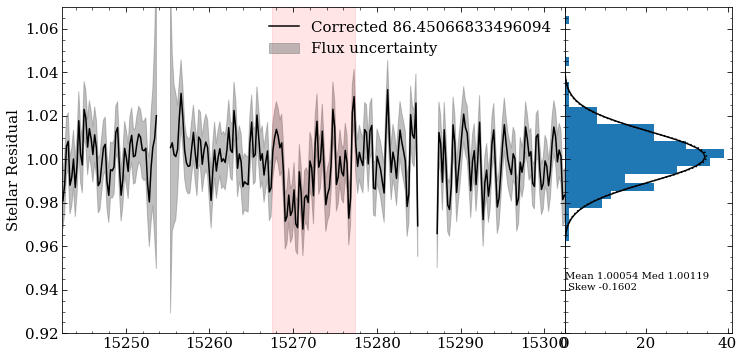

5771.0283


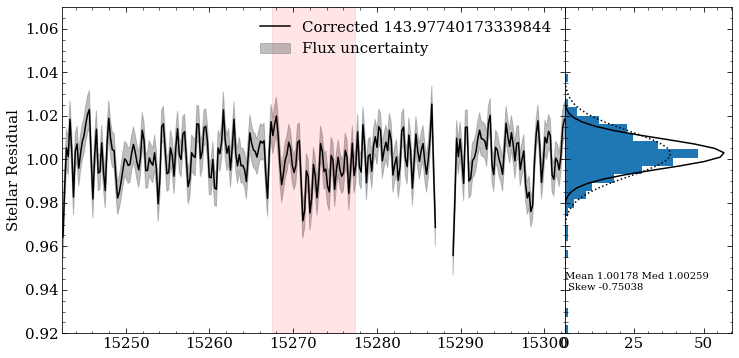

6080.2256


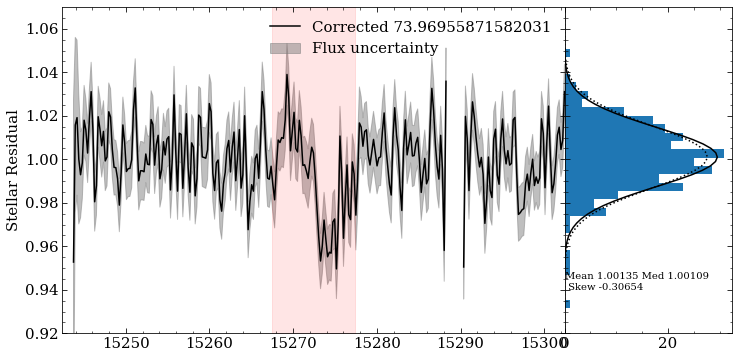

6100.1084


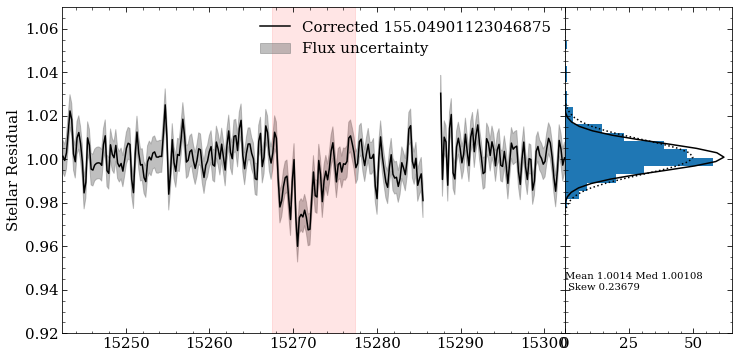

5586.3267


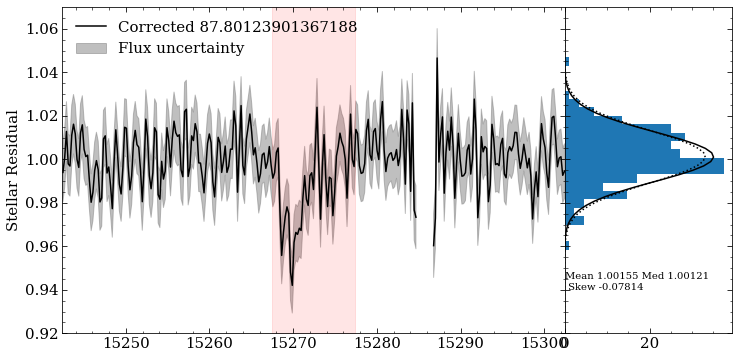

5471.7847


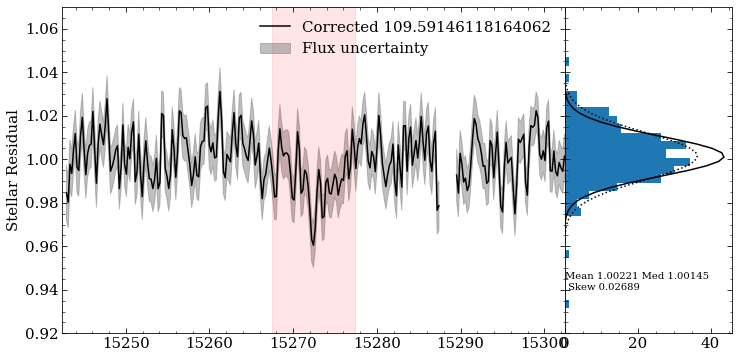

5792.622


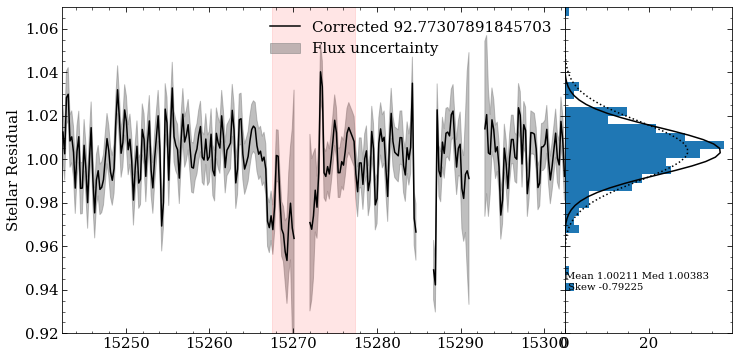

In [22]:
weird_sample_4 = np.arange(len(CA_meta))[(CA_meta['GOODBAD'] == False) & (CA_meta['SNR'] > 70)]
for i in weird_sample_4[::50]:
    star = CA_meta[i]
    print(star['TEFF'])
    fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (12,6), sharey = True, gridspec_kw = {'wspace':0, 'width_ratios':(3,1)})

    bitmask = spectra[i, :, 3].astype(int)
    mask_digits = [0, 1, 2, 9, 12, 13]
    mask = np.zeros(bitmask.shape)
    for digit in mask_digits:
        mask = mask + np.bitwise_and(bitmask.astype(int), 2**digit) 
    error_mask = spectra[i, :, 1] > np.percentile(spectra[i, :, 1], 95)
    mask = (mask + error_mask).astype(int)
    mask = mask.astype(bool)
    mask = (mask + np.roll(mask, 1) + np.roll(mask, -1)).astype(bool)

    snr = star['SNR']
    residual = np.ma.array(residuals[i, :, 0]/medresiduals[i, :, 0], mask = mask)
    axs[0].plot(wavs[window], residual[window] , color = 'k', linestyle = 'solid', label = 'Corrected {}'.format(snr))
    # axs[0].plot(wavs[window], residual[window], color = 'r', linestyle = 'dashed', label = 'Uncorrected')


    axs[0].fill_between(wavs[window], (residual + residuals[i, :, 1])[window], 
                    (residual - residuals[i, :, 1])[window], color = 'grey', alpha = 0.5, label = 'Flux uncertainty')
    axs[0].set_ylim(0.92, 1.07)
    axs[0].set_ylabel('Stellar Residual')
    axs[0].legend()
    axs[0].fill_between((lambda0-window_r,lambda0+window_r), (1.07, 1.07), (0.92,0.92), color='r', alpha = 0.1)
    axs[0].set_xlim(lambda0 - 30, lambda0 + 30)

    residual_filled = residual.filled(np.nan)
    continuum_mean = np.nanmean(residual_filled[noDIBwindow])
    continuum_median = np.nanmedian(residual_filled[noDIBwindow])
    sig_empirical = np.nanstd(residual_filled[noDIBwindow], ddof = 1)
    skewness = skew(residual_filled[noDIBwindow], nan_policy = 'omit')

    mu = 1
    mu = continuum_median
    sig = 1/star['SNR']

    y = np.linspace(0.9, 1.1, 100) 
    x = 1 / (sig * np.sqrt(2 * np.pi )) * np.exp(-(y - mu)**2 / (2 * sig**2))
    x_empirical = 1 / (sig_empirical * np.sqrt(2 * np.pi )) * np.exp(-(y - mu)**2 / (2 * sig_empirical**2))

    axs[1].hist(residual[noDIBwindow], orientation = 'horizontal', density = True, bins = np.linspace(0.92, 1.07, 40))
    # axs[1].set_xlim(0,)
    axs[1].text(0.01, 0.94, 'Mean {s1} Med {s2} \n Skew {s3}'.format(s1 = np.round(continuum_mean, 5), s2 = np.round(continuum_median, 5), s3 = np.round(skewness, 5)))
    axs[1].plot(x, y, linestyle = 'solid', color = 'k', label = 'Theoretical')
    axs[1].plot(x_empirical, y, linestyle = 'dotted', color = 'k', label = 'Empirical')


    plt.show()

3.2472863


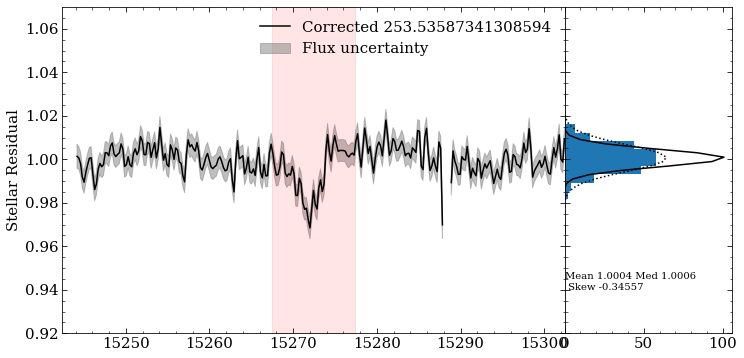

8.281912


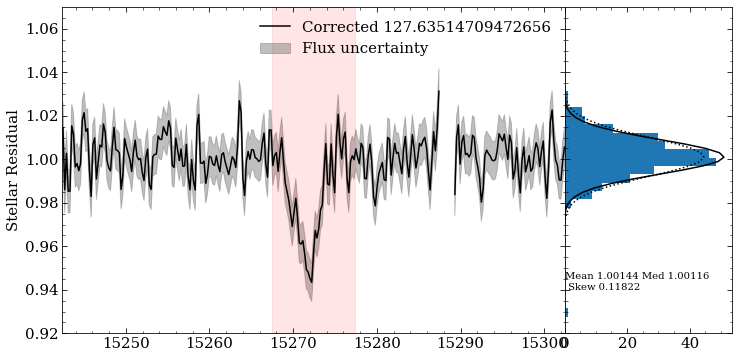

10.109433


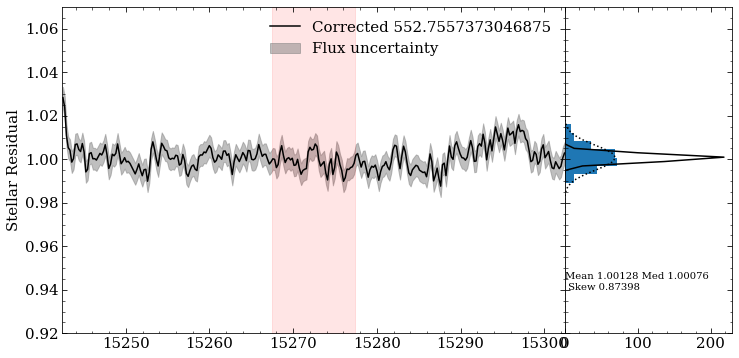

14.967583


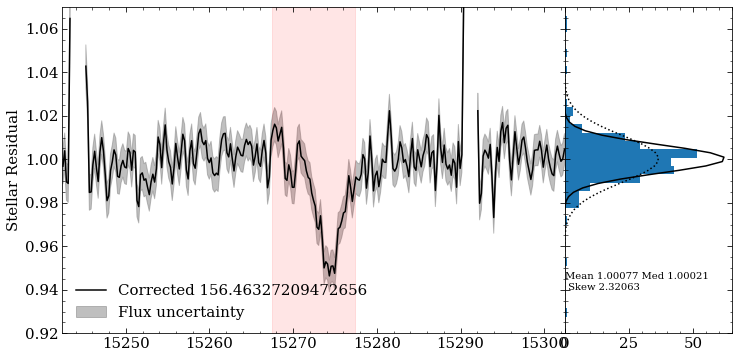

3.7735732


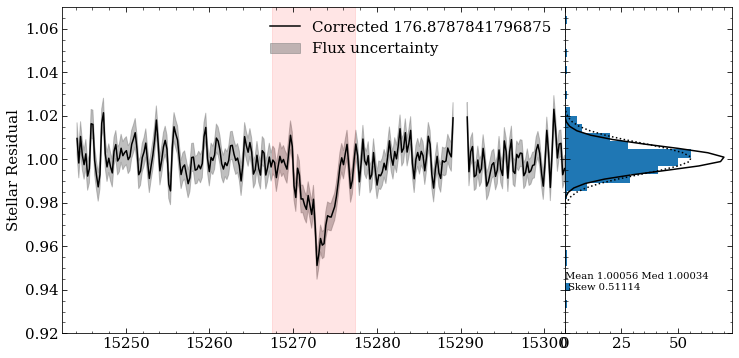

2.3180597


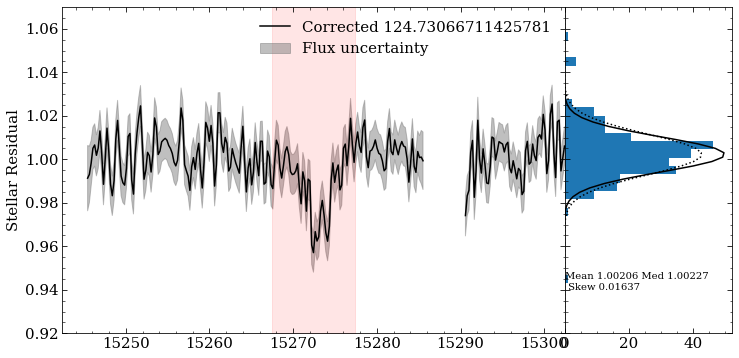

1.1203686


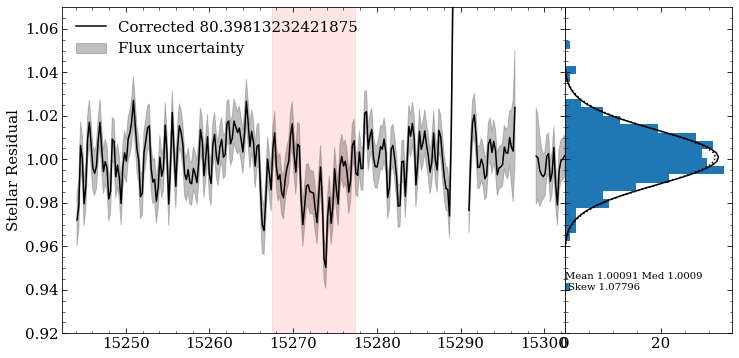

1.7115983


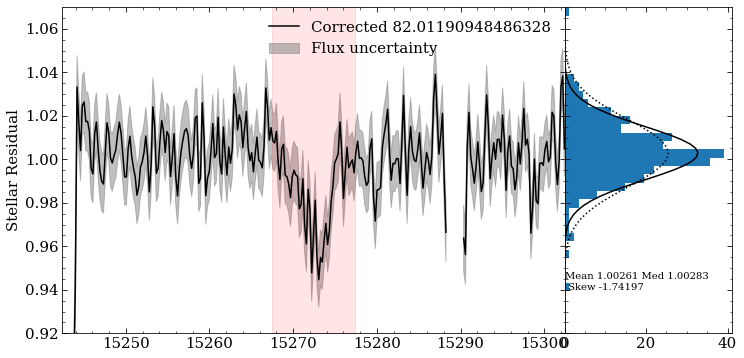

4.657778


/tmp/ipykernel_161208/944906682.py:18: RuntimeWarning: divide by zero encountered in true_divide
  residual = np.ma.array(residuals[i, :, 0]/medresiduals[i, :, 0], mask = mask)
/uufs/chpc.utah.edu/sys/installdir/r8/python/3.10.3/lib/python3.10/site-packages/numpy-1.22.3-py3.10-linux-x86_64.egg/numpy/lib/nanfunctions.py:1741: RuntimeWarning: invalid value encountered in subtract
  np.subtract(arr, avg, out=arr, casting='unsafe', where=where)


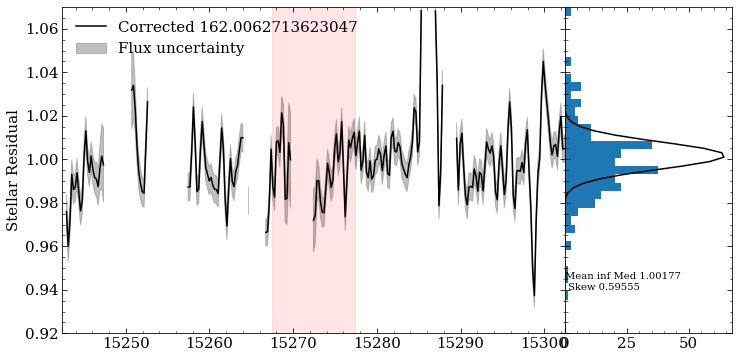

12.4061


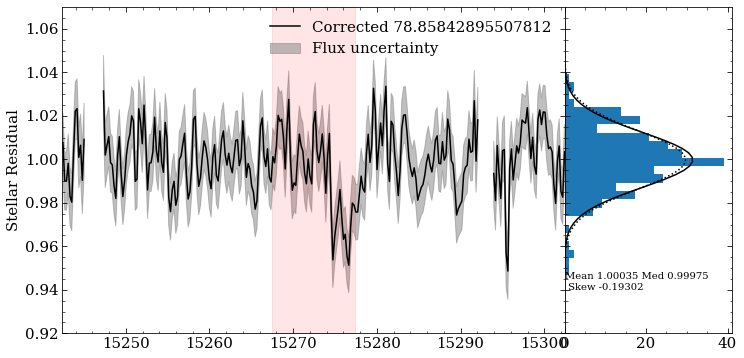

1.4150137


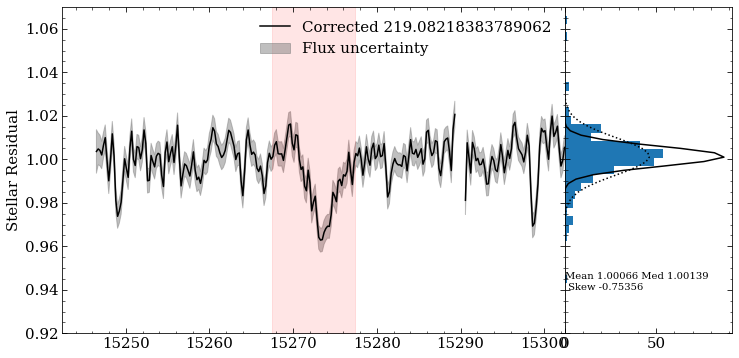

5.0078096


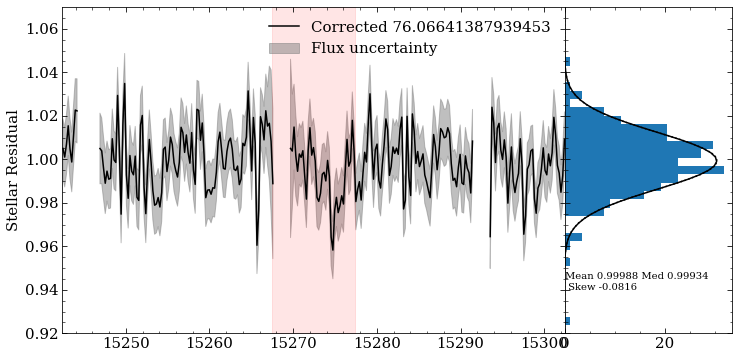

6.09633


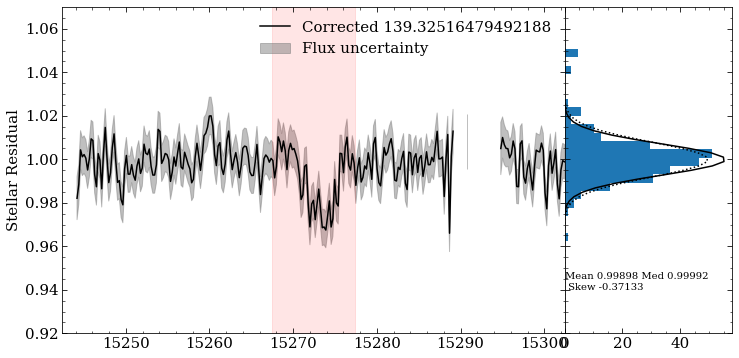

1.8134742


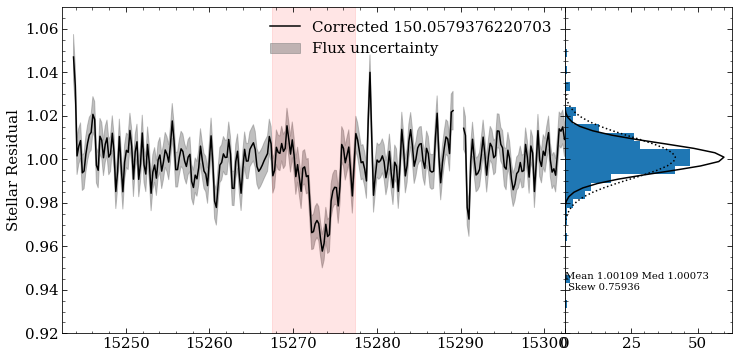

1.150694


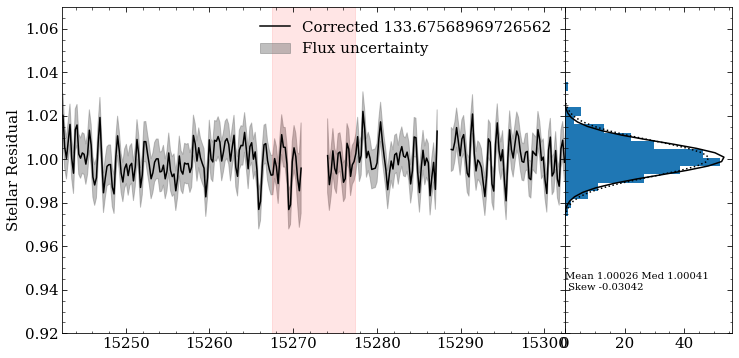

1.2005467


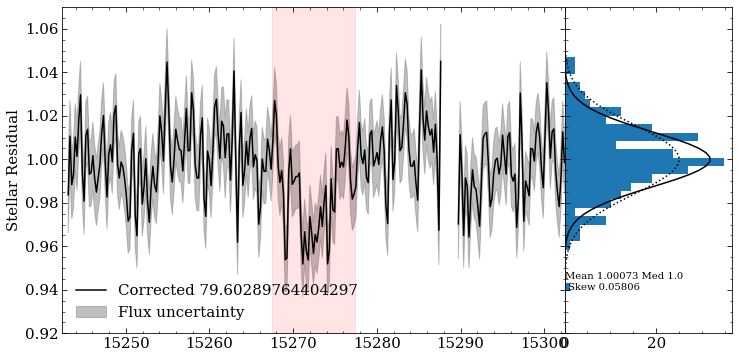

1.6151063


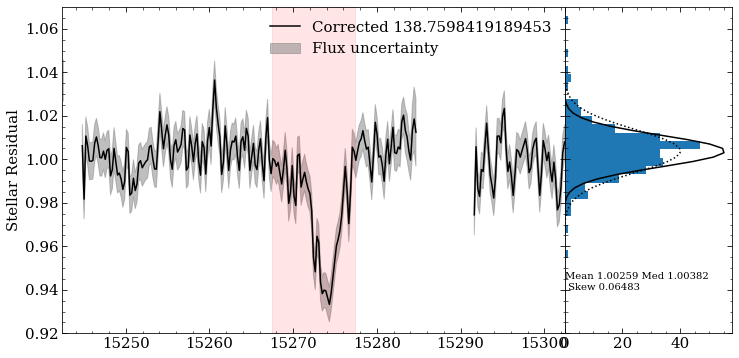

7.894807


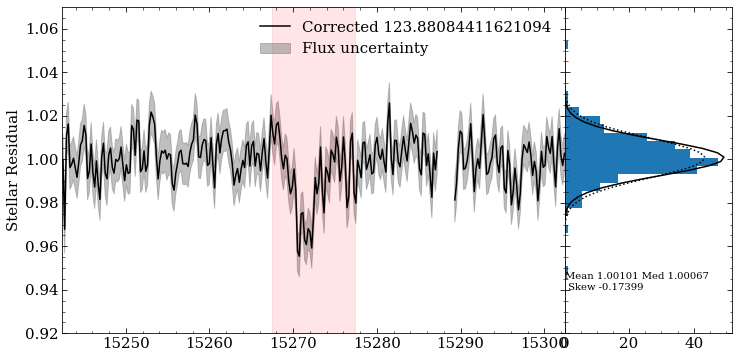

43.146107


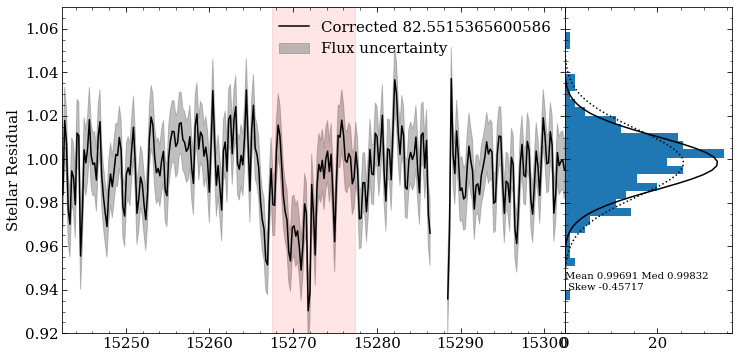

22.1355


/tmp/ipykernel_161208/944906682.py:18: RuntimeWarning: divide by zero encountered in true_divide
  residual = np.ma.array(residuals[i, :, 0]/medresiduals[i, :, 0], mask = mask)


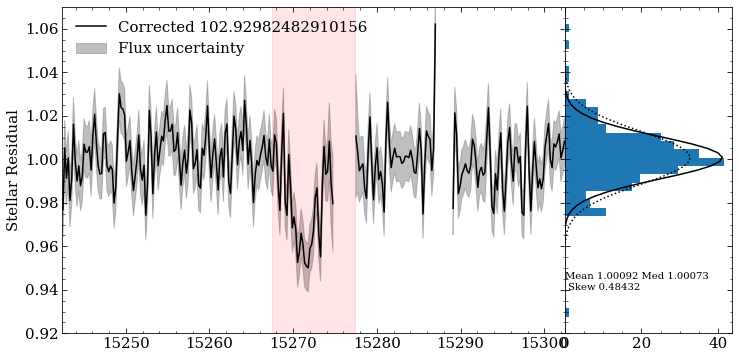

7.1387143


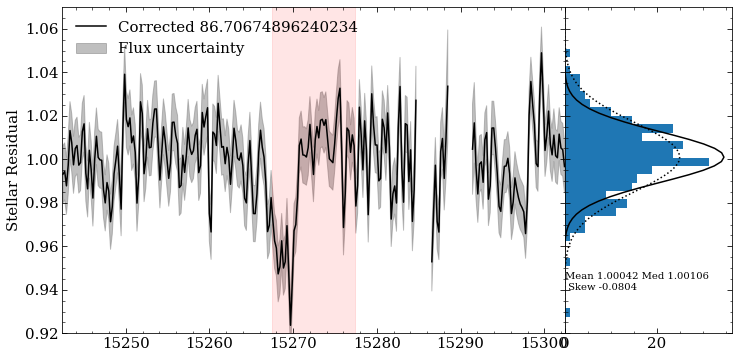

2.1624644


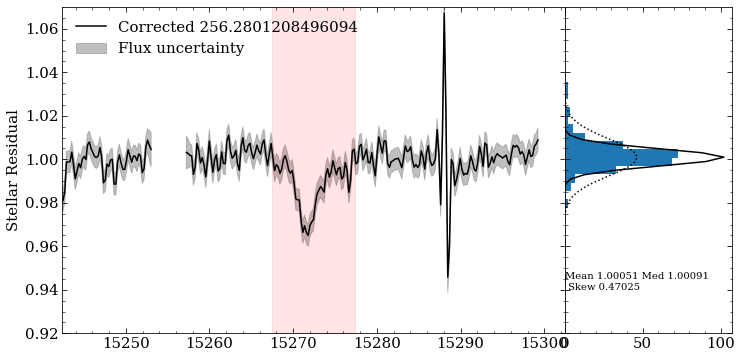

2.745478


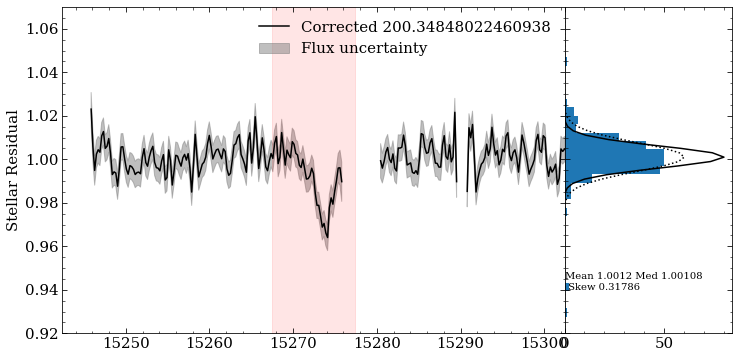

5.6641784


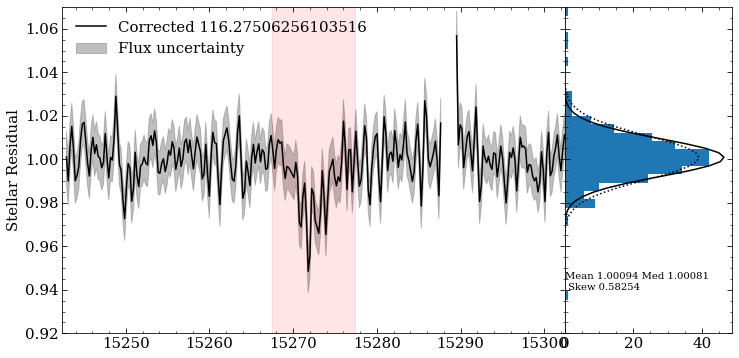

1.4437702


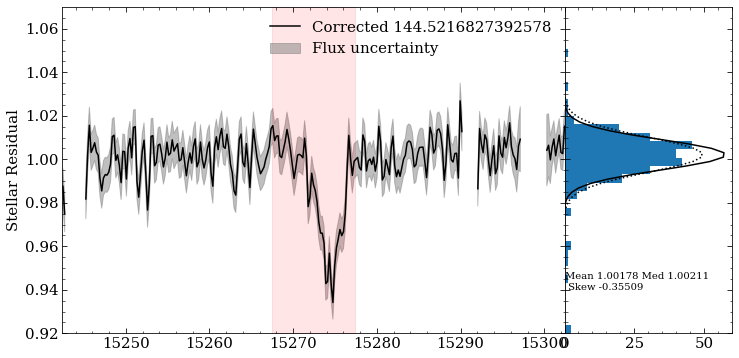

12.156306


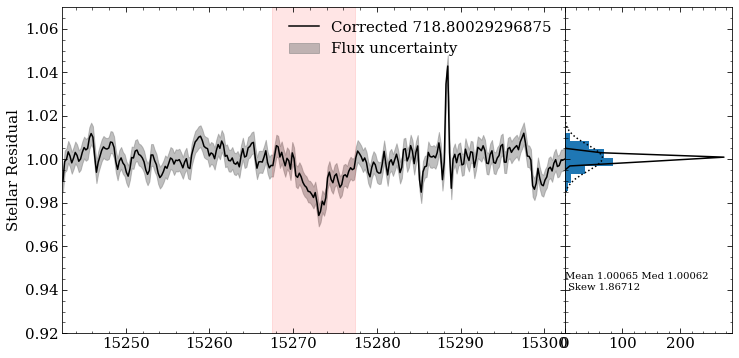

2.938986


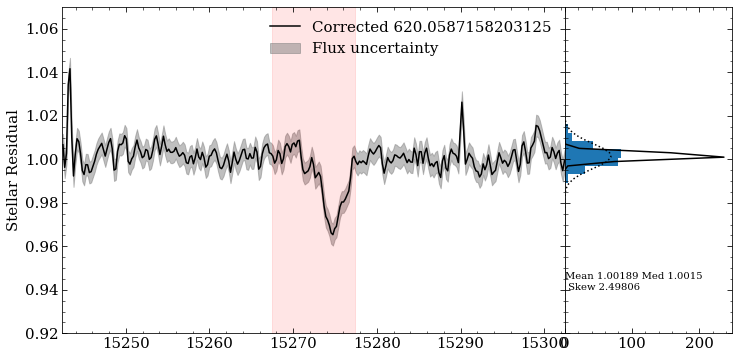

In [23]:
weird_sample_5 = np.arange(len(CA_meta))[CA_meta['VSCATTER']> 1]
for i in weird_sample_5:
    star = CA_meta[i]
    print(star['VSCATTER'])
    fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (12,6), sharey = True, gridspec_kw = {'wspace':0, 'width_ratios':(3,1)})

    bitmask = spectra[i, :, 3].astype(int)
    mask_digits = [0, 1, 2, 9, 12, 13]
    mask = np.zeros(bitmask.shape)
    for digit in mask_digits:
        mask = mask + np.bitwise_and(bitmask.astype(int), 2**digit) 
    error_mask = spectra[i, :, 1] > np.percentile(spectra[i, :, 1], 95)
    mask = (mask + error_mask).astype(int)
    mask = mask.astype(bool)
    mask = (mask + np.roll(mask, 1) + np.roll(mask, -1)).astype(bool)

    snr = star['SNR']
    residual = np.ma.array(residuals[i, :, 0]/medresiduals[i, :, 0], mask = mask)
    axs[0].plot(wavs[window], residual[window] , color = 'k', linestyle = 'solid', label = 'Corrected {}'.format(snr))
    # axs[0].plot(wavs[window], residual[window], color = 'r', linestyle = 'dashed', label = 'Uncorrected')


    axs[0].fill_between(wavs[window], (residual + residuals[i, :, 1])[window], 
                    (residual - residuals[i, :, 1])[window], color = 'grey', alpha = 0.5, label = 'Flux uncertainty')
    axs[0].set_ylim(0.92, 1.07)
    axs[0].set_ylabel('Stellar Residual')
    axs[0].legend()
    axs[0].fill_between((lambda0-window_r,lambda0+window_r), (1.07, 1.07), (0.92,0.92), color='r', alpha = 0.1)
    axs[0].set_xlim(lambda0 - 30, lambda0 + 30)

    residual_filled = residual.filled(np.nan)
    continuum_mean = np.nanmean(residual_filled[noDIBwindow])
    continuum_median = np.nanmedian(residual_filled[noDIBwindow])
    sig_empirical = np.nanstd(residual_filled[noDIBwindow], ddof = 1)
    skewness = skew(residual_filled[noDIBwindow], nan_policy = 'omit')

    mu = 1
    mu = continuum_median
    sig = 1/star['SNR']

    y = np.linspace(0.9, 1.1, 100) 
    x = 1 / (sig * np.sqrt(2 * np.pi )) * np.exp(-(y - mu)**2 / (2 * sig**2))
    x_empirical = 1 / (sig_empirical * np.sqrt(2 * np.pi )) * np.exp(-(y - mu)**2 / (2 * sig_empirical**2))

    axs[1].hist(residual[noDIBwindow], orientation = 'horizontal', density = True, bins = np.linspace(0.92, 1.07, 40))
    # axs[1].set_xlim(0,)
    axs[1].text(0.01, 0.94, 'Mean {s1} Med {s2} \n Skew {s3}'.format(s1 = np.round(continuum_mean, 5), s2 = np.round(continuum_median, 5), s3 = np.round(skewness, 5)))
    axs[1].plot(x, y, linestyle = 'solid', color = 'k', label = 'Theoretical')
    axs[1].plot(x_empirical, y, linestyle = 'dotted', color = 'k', label = 'Empirical')


    plt.show()

Text(0, 0.5, 'Residual Model')

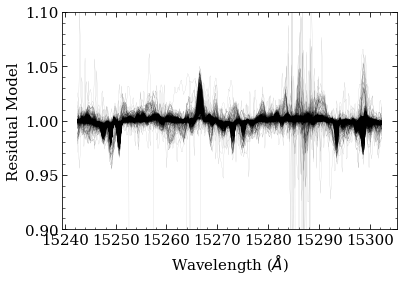

In [24]:
fig, ax = plt.subplots()
for i in range(len(CA_meta)):
    ax.plot(wavs[window], medresiduals[i, window, 0], linewidth = 0.1, color = 'k', alpha = 0.5)
ax.set_ylim(.9, 1.1)
ax.set_xlabel('Wavelength ($\AA$)')
ax.set_ylabel('Residual Model')

Text(0.5, 0, 'ASPCAP_CHI2')

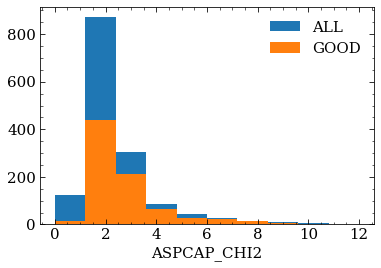

In [25]:
fig, ax = plt.subplots()
ax.hist(CA_meta["ASPCAP_CHI2"], range = (0, 12), label = "ALL")
ax.hist(CA_meta['ASPCAP_CHI2'][CA_meta['GOODBAD']], range = (0, 12), label = "GOOD")
ax.legend()
ax.set_xlabel('ASPCAP_CHI2')

In [26]:
np.sum(CA_meta['GOODBAD']) / len(CA_meta)

0.5375838926174497

In [27]:
### Data filtering ###
# import residuals
# mask skylines, persistence, whatever else
# mask pixels with large medres uncertainty
# propogate uncertainty from medres. Perhaps also find a way to put goodness of ASPCAP fit into?


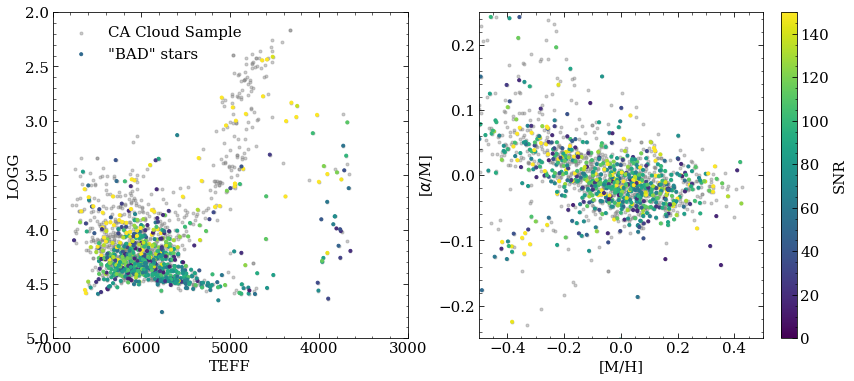

In [28]:
fig, axs = plt.subplots(figsize = (14,6), nrows = 1, ncols =2)
vmin, vmax = 0, 150
bad = CA_meta['GOODBAD'] == False
axs[0].scatter(CA_meta['TEFF'], CA_meta['LOGG'], c = 'grey', alpha = 0.4, marker = '.', label = 'CA Cloud Sample')
axs[0].scatter(CA_meta['TEFF'][bad], CA_meta['LOGG'][bad], c = CA_meta['SNR'][bad],  vmin = vmin, vmax = vmax, marker = '.', label = '\"BAD\" stars')
axs[0].set_xlim(7000, 3000)
axs[0].set_ylim(5,2)
axs[0].set_xlabel('TEFF')
axs[0].set_ylabel('LOGG')
axs[0].legend()

axs[1].scatter(CA_meta['M_H'], CA_meta['ALPHA_M'], c = 'grey', alpha = 0.4, marker = '.')
points = axs[1].scatter(CA_meta['M_H'][bad], CA_meta['ALPHA_M'][bad], c = CA_meta['SNR'][bad],  vmin = vmin, vmax = vmax, marker = '.')
axs[1].set_xlim(-0.5, 0.5)
axs[1].set_ylim(-0.25,0.25)
axs[1].set_xlabel('[M/H]')
axs[1].set_ylabel(r'[$\alpha$/M]')
fig.colorbar(points, ax = axs[1], label = 'SNR')
fig.set_facecolor('white')
plt.show()

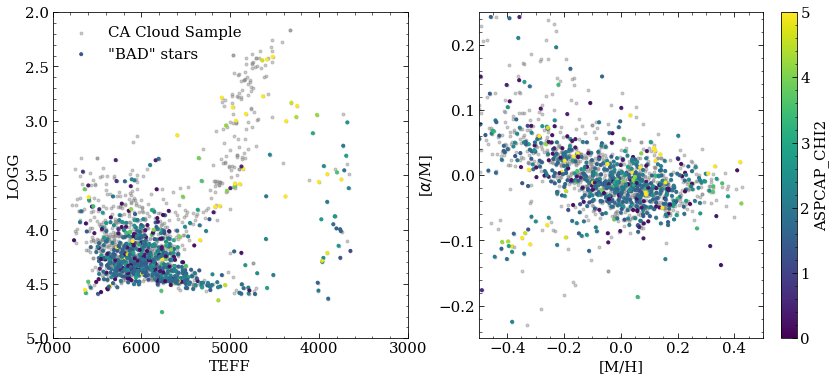

In [29]:
fig, axs = plt.subplots(figsize = (14,6), nrows = 1, ncols =2)
vmin, vmax = 0, 5
bad = CA_meta['GOODBAD'] == False
axs[0].scatter(CA_meta['TEFF'], CA_meta['LOGG'], c = 'grey', alpha = 0.4, marker = '.', label = 'CA Cloud Sample')
axs[0].scatter(CA_meta['TEFF'][bad], CA_meta['LOGG'][bad], c = CA_meta['ASPCAP_CHI2'][bad],  vmin = vmin, vmax = vmax, marker = '.', label = '\"BAD\" stars')
axs[0].set_xlim(7000, 3000)
axs[0].set_ylim(5,2)
axs[0].set_xlabel('TEFF')
axs[0].set_ylabel('LOGG')
axs[0].legend()

axs[1].scatter(CA_meta['M_H'], CA_meta['ALPHA_M'], c = 'grey', alpha = 0.4, marker = '.')
points = axs[1].scatter(CA_meta['M_H'][bad], CA_meta['ALPHA_M'][bad], c = CA_meta['ASPCAP_CHI2'][bad],  vmin = vmin, vmax = vmax, marker = '.')
axs[1].set_xlim(-0.5, 0.5)
axs[1].set_ylim(-0.25,0.25)
axs[1].set_xlabel('[M/H]')
axs[1].set_ylabel(r'[$\alpha$/M]')
fig.colorbar(points, ax = axs[1], label = 'ASPCAP_CHI2')
fig.set_facecolor('white')
plt.show()

In [30]:
np.concatenate([np.linspace(0, 300, 40), [np.nanmax(CA_meta['SNR'])]])

array([   0.        ,    7.69230769,   15.38461538,   23.07692308,
         30.76923077,   38.46153846,   46.15384615,   53.84615385,
         61.53846154,   69.23076923,   76.92307692,   84.61538462,
         92.30769231,  100.        ,  107.69230769,  115.38461538,
        123.07692308,  130.76923077,  138.46153846,  146.15384615,
        153.84615385,  161.53846154,  169.23076923,  176.92307692,
        184.61538462,  192.30769231,  200.        ,  207.69230769,
        215.38461538,  223.07692308,  230.76923077,  238.46153846,
        246.15384615,  253.84615385,  261.53846154,  269.23076923,
        276.92307692,  284.61538462,  292.30769231,  300.        ,
       1122.09460449])

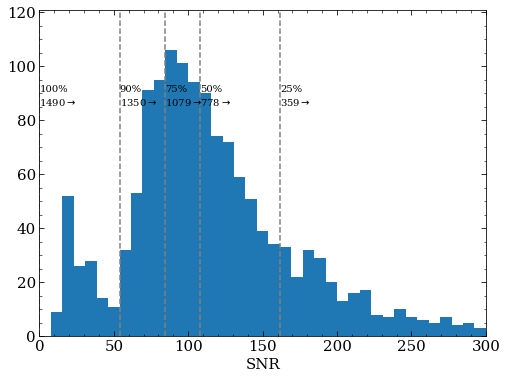

In [31]:
fig, ax= plt.subplots(figsize = (8,6))
hist = ax.hist(CA_meta['SNR'], bins=  np.concatenate([np.linspace(0, 300, 40), [np.nanmax(CA_meta['SNR'])]]))
ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin, ymax)
count = np.flip(np.cumsum(np.flip(hist[0])))
count_norm = count/np.max(count)
for val in (0.25, 0.5, 0.75, 0.9, 1):
    xpos = hist[1][np.argmin(np.abs(count_norm - val))]
    count_at = count[np.argmin(np.abs(count_norm - val))]
    ax.plot([xpos, xpos], [ymin, ymax], linestyle = 'dashed', color = 'grey')
    ax.text(xpos, (ymax - ymin) * .75, str(int(val * 100)) + '%')
    ax.text(xpos, (ymax - ymin) * .75 - 5, str(int(count_at)) + r'$\rightarrow$')

ax.set_xlim(0, 300)
ax.set_xlabel('SNR')
fig.set_facecolor('white')
plt.show()

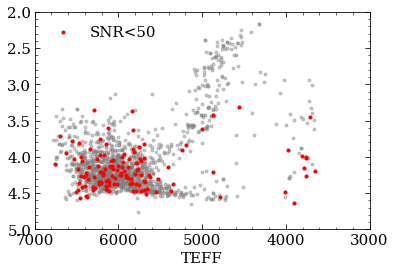

In [32]:
fig, ax = plt.subplots()
ax.scatter(CA_meta['TEFF'], CA_meta['LOGG'], marker = '.', c = 'grey', alpha = 0.4)
ax.scatter(CA_meta['TEFF'][CA_meta['SNR'] <50], CA_meta['LOGG'][CA_meta['SNR'] <50], marker = '.', c = 'r', label = 'SNR<50')
ax.set_xlim(7000,3000)
ax.set_ylim(5,2)
ax.legend()
ax.set_xlabel("TEFF")
ax.set_label('LOGG')
plt.show()

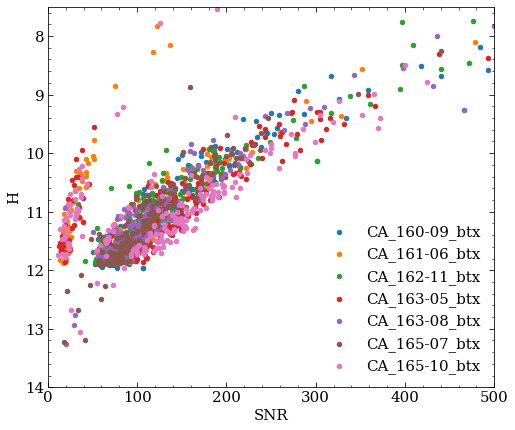

In [33]:
fig, ax = plt.subplots(figsize = (8, 7))
for field in np.unique(CA_meta['FIELD']):
    field_idx = CA_meta['FIELD'] == field
    ax.scatter(CA_meta['SNR'][field_idx], CA_meta['H'][field_idx], marker = 'o', s = 20, label = field)
ax.set_xlabel('SNR')
ax.set_ylabel('H')
fig.set_facecolor('white')
ax.set_xlim(0, 500)
ax.set_ylim(14, 7.5)
ax.legend()
plt.show()

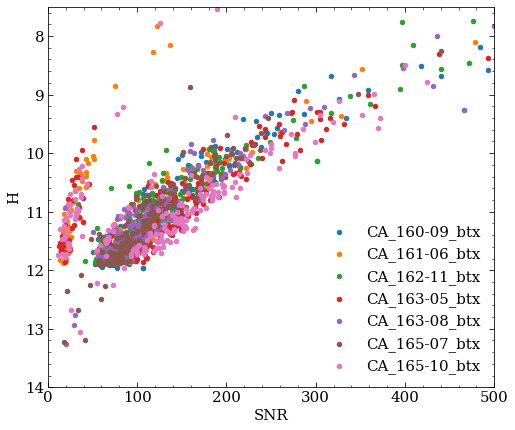

In [34]:
fig, ax = plt.subplots(figsize = (8, 7))
for field in np.unique(CA_meta['FIELD']):
    field_idx = CA_meta['FIELD'] == field
    ax.scatter(CA_meta['SNR'][field_idx], CA_meta['H'][field_idx], marker = 'o', s = 20, label = field)
ax.set_xlabel('SNR')
ax.set_ylabel('H')
fig.set_facecolor('white')
ax.set_xlim(0, 500)
ax.set_ylim(14, 7.5)
ax.legend()
plt.show()

In [35]:
CA_weird = CA_meta[CA_meta['SNR'] < 50]
CA_weird

APOGEE_ID,TELESCOPE,FIELD,RA,DEC,GLON,GLAT,J,H,K,AK_TARG,AK_WISE,VHELIO_AVG,GAIAEDR3_PARALLAX,TEFF,LOGG,M_H,ALPHA_M,ASPCAP_CHI2_1,MEDRES_NBIN,FILE,DIST,SFD_EBV,SNR,ASPCAPFLAG,STARFLAG,ASPCAP_CHI2_2,CONT_SHIFT,VERG_AV,VERG_AV_ERR,ALLSTAR_IDX,dist16,dist50,dist84,AV16,AV50,AV84,GOODBAD,ASPCAP_CHI2,VSCATTER,MEANFIB,NVISITS
str30,str6,str20,float64,float64,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int64,str27,float32,float32,float32,int64,int64,float32,float64,float64,float64,int64,float32,float32,float32,float32,float32,float32,bool,float32,float32,float32,int32
2M04085186+3652220,apo25m,CA_162-11_btx,62.216085,36.872791,161.12238492866254,-10.960163828076837,11.193,10.867,10.774,0.064259894,0.064259894,8.016666,1.8454632,6077.2744,4.1221604,0.019451,0.0037271369,1.2320746,1320,res_2M04085186+3652220.fits,541.8694,0.29803467,33.290802,0,2048,1.2320746,0.0024587461048495296,1.4532080629101196,0.00195,89617,0.52818036,0.5347403,0.54069465,0.5902559,0.81471103,0.98415464,False,1.2320746,0.0,299.0,1
2M04104748+3430187,apo25m,CA_162-11_btx,62.697866,34.505203,163.0840800902245,-12.398296697681014,12.256,11.851,11.695,0.12484788,0.12484788,-16.33046,2.2868173,5348.88,4.375572,0.065127,-0.0118567,1.3132881,309,res_2M04104748+3430187.fits,437.28897,0.36272892,41.17219,16448,2048,1.3132881,0.0031434403980741266,0.9454785418208178,0.0017,90559,0.42579332,0.43051413,0.43587932,0.5941267,0.6795493,0.7571481,False,1.3132881,0.0,6.9999995,1
2M04200408+3839280,apo25m,CA_161-06_btx,65.017029,38.657799,161.4631133089199,-8.13621586662594,11.325,10.979,10.892,0.038556006,0.038556006,10.801375,2.5671015,6051.1025,4.3681855,0.13571,-0.0494477,0.25118864,668,res_2M04200408+3839280.fits,389.5444,1.1539377,26.288935,134218370,50331648,0.25118864,-0.0013012941435758263,1.4859834739181639,0.00391,95981,0.38196677,0.3858188,0.3898668,0.32703894,0.5270054,0.71827614,False,0.25118864,0.0,118.99999,1
2M04200908+3905086,apo25m,CA_161-06_btx,65.03785,39.085735,161.1679255187966,-7.823268636618365,12.056,11.711,11.597,0.13035636,0.13035636,5.2499523,2.0699499,5978.9155,4.2448854,-0.16044,0.0425753,0.29751578,2013,res_2M04200908+3905086.fits,483.1035,0.85605794,17.47211,134217792,50331648,0.29751578,0.0007932649070385711,1.1874484060108639,0.00233,96030,0.46786174,0.4743042,0.48084766,0.7007095,0.9653845,1.2149084,False,0.29751578,0.0,115.00001,1
2M04201099+3918344,apo25m,CA_161-06_btx,65.045792,39.309559,161.0120320031894,-7.6611777994304,11.782,11.436,11.304,0.087209545,0.087209545,70.45716,2.3238912,5795.5396,4.46517,0.042976,0.028028298,0.25320366,761,res_2M04201099+3918344.fits,430.31274,0.8050065,25.72364,134234246,50331648,0.25320366,-0.001404198357212172,0.7468374553293676,0.00237,96043,0.41818905,0.42250538,0.42676458,0.5561201,0.83142215,1.0343266,False,0.25320366,0.0,113.00001,1
2M04201389+3910458,apo25m,CA_161-06_btx,65.057898,39.179401,161.11189467349215,-7.746240632697152,10.625,10.399,10.326,0.073440105,0.073440105,40.09702,2.5212903,6481.1553,4.168409,-0.00031185,0.0155603,0.33015662,624,res_2M04201389+3910458.fits,396.6223,0.8039151,43.27612,64,50331648,0.33015662,-0.0013476102394188727,1.3652037169482314,0.00365,96076,0.38445562,0.3897979,0.39523688,0.3927302,0.6376548,0.8482855,False,0.33015662,0.0,110.0,1
2M04202056+3917209,apo25m,CA_161-06_btx,65.085672,39.289143,161.04858989817248,-7.653663218579515,10.719,10.373,10.246,0.12668374,0.12668374,-67.21613,2.1487265,5965.3237,4.2297845,0.079608,-0.0967447,0.3389378,2859,res_2M04202056+3917209.fits,465.39194,0.8222982,37.53151,0,50331648,0.3389378,-0.002052952142222897,1.2124376840667563,0.00352,96144,0.45359957,0.4586895,0.46501014,0.997732,1.189498,1.37891,False,0.3389378,0.0,111.00001,1
2M04202095+3907396,apo25m,CA_161-06_btx,65.087316,39.12767,161.1651712962766,-7.766484352494075,12.171,11.823,11.722,nan,0.12393039,7.7983217,2.1300476,5819.9053,4.468971,-0.036221,-0.0324637,0.21713008,761,res_2M04202095+3907396.fits,469.473

In [36]:
starflag_names = np.array(['BAD_PIXELS','COMMISSIONING','BRIGHT_NEIGHBOR','VERY_BRIGHT_NEIGHBOR','LOW_SNR'	,'','','','','PERSIST_HIGH'	,'PERSIST_MED','PERSIST_LOW','PERSIST_JUMP_POS'	,
                'PERSIST_JUMP_NEG','','','SUSPECT_RV_COMBINATION','SUSPECT_BROAD_LINES'], dtype = 'str')

aspcapflag_names = np.array(['TEFF_WARN','LOGG_WARN	','VMICRO_WARN	','METALS_WARN','ALPHAFE_WARN'	,'CFE_WARN','NFE_WARN','STAR_WARN','CHI2_WARN','COLORTE_WARN','ROTATION_WARN','SN_WARN','',
                '','VSINI_WARN','','TEFF_BAD', 'LOGG_BAD', "VMICRO_BAD", 'METALS_BAD', 'ALPHAFE_BAD', 'CFE_BAD', 'NFE_BAD', 'STAR_BAD', 'CHI2_BAD', 'COLORTE_BAD',
                'ROTATION_BAD', 'SN_BAD', '', '', "VSINI_BAD", 'NO_ASPCAP_RESULT'], dtype = 'str')

print("STARFLAG    Count")
starflags_count = np.zeros(18)
for i in range(18):
    starflags = (CA_weird['STARFLAG'] & 2**i).astype(bool).astype(int)
    starflags_count[i] = np.sum(starflags)
    if starflags_count[i] > 0:
        print(starflag_names[i], int(starflags_count[i]))

print('----------------')
print("ASPCAPFLAGS    count")
aspcapflags_count = np.zeros(32)
for i in range(32):
    aspcapflags = (CA_weird['ASPCAPFLAG'] & 2**i).astype(bool).astype(int)
    aspcapflags_count[i] = np.sum(aspcapflags)
    if aspcapflags_count[i] > 0:
        print(aspcapflag_names[i], int(aspcapflags_count[i]))


STARFLAG    Count
BRIGHT_NEIGHBOR 14
PERSIST_MED 2
PERSIST_LOW 24
PERSIST_JUMP_NEG 1
SUSPECT_BROAD_LINES 4
----------------
ASPCAPFLAGS    count
TEFF_WARN 7
LOGG_WARN	 13
VMICRO_WARN	 57
CFE_WARN 11
NFE_WARN 52
STAR_WARN 36
COLORTE_WARN 22
VSINI_WARN 37
VMICRO_BAD 1
CFE_BAD 1
SN_BAD 85
VSINI_BAD 3


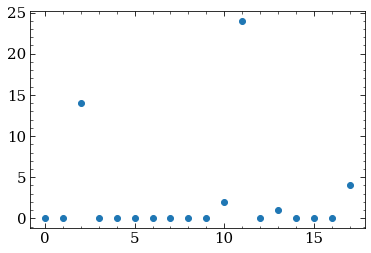

ValueError: x and y must be the same size

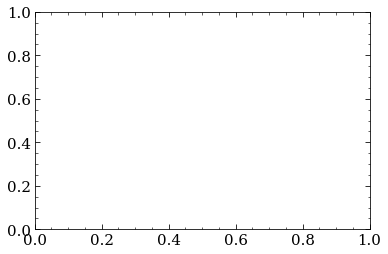

In [37]:
fig, ax = plt.subplots()
ax.scatter(np.arange(18), starflags_count)
plt.show()
fig, ax = plt.subplots()
ax.scatter(np.arange(18), aspcapflags_count)

In [ ]:
CA_meta.columns

In [ ]:
starflag_names = np.array(['BAD_PIXELS','COMMISSIONING','BRIGHT_NEIGHBOR','VERY_BRIGHT_NEIGHBOR','LOW_SNR'	,'','','','','PERSIST_HIGH'	,'PERSIST_MED','PERSIST_LOW','PERSIST_JUMP_POS'	,
                'PERSIST_JUMP_NEG','','','SUSPECT_RV_COMBINATION','SUSPECT_BROAD_LINES'], dtype = 'str')
starflag_names[starflags_count > 0]

aspcapflag_names = np.array(['TEFF_WARN','LOGG_WARN	','VMICRO_WARN	','METALS_WARN','ALPHAFE_WARN'	,'CFE_WARN','NFE_WARN','STAR_WARN','CHI2_WARN','COLORTE_WARN','ROTATION_WARN','SN_WARN','',
                '','VSINI_WARN','','TEFF_BAD', 'LOGG_BAD', "VMICRO_BAD", 'METALS_BAD', 'ALPHAFE_BAD', 'CFE_BAD', 'NFE_BAD', 'STAR_BAD', 'CHI2_BAD', 'COLORTE_BAD',
                'ROTATION_BAD', 'SN_BAD', '', '', "VSINI_BAD", 'NO_ASPCAP_RESULT'], dtype = 'str')
starflag_names[starflags_count > 0]

In [ ]:
fig, ax = plt.subplots()
ax.scatter(CA_meta['J'] - CA_meta['K'], CA_meta['H'], marker = '.', c = 'grey', alpha = 0.4)
ax.scatter((CA_meta['J'] - CA_meta['K'])[CA_meta['SNR'] < 50], CA_meta['H'][CA_meta["SNR"] < 50], c = 'r', marker = '.')
ax.set_xlabel('H-K')
ax.set_ylabel('H')
ax.set_xlim(0, 1.5)
ax.set_ylim(12, 7.5)

In [ ]:
fig, ax = plt.subplots(figsize = (8, 6))
points = ax.scatter(CA_meta["SNR"], CA_meta['H'], c = CA_meta['MEANFIB'])
ax.set_xlabel("SNR")
ax.set_ylabel('H')
ax.set_ylim(14, 6.5)
fig.colorbar(points, label = 'MEANFIB')
ax.set_xlim(0, 300)
fig.set_facecolor('white')
plt.show()

In [ ]:
CA_meta

In [ ]:
fig, ax = plt.subplots(figsize = (8, 8))
ax.scatter(CA_meta['GLON'], CA_meta['GLAT'], c = 'grey', alpha = 0.4, marker = 'o', s= 20)
points = ax.scatter(CA_weird['GLON'], CA_weird['GLAT'], marker = 'o', s= 20, c = CA_weird['MEANFIB'])
fig.colorbar(points, label = 'MEANFIB')
ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
fig.set_facecolor('white')
plt.show()